### Enviroment Set-UP

In [ ]:
import sys

assert sys.version_info >= (3, 7)


In [2]:
from packaging import version
import sklearn

assert version.parse(sklearn.__version__) >= version.parse("1.0.1")


In [3]:
import os
IS_COLAB = "google.colab" in sys.modules
IS_KAGGLE = "kaggle_secrets" in sys.modules or "KAGGLE_URL_BASE" in os.environ

if IS_COLAB or IS_KAGGLE:
    os.environ["TF_USE_LEGACY_KERAS"] = "1"
    import tf_keras


2025-07-15 16:59:12.872324: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752598753.030399      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752598753.077315      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
import tensorflow as tf

assert version.parse(tf.__version__) >= version.parse("2.8.0")


In [5]:
import matplotlib.pyplot as plt

plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)


In [6]:
from pathlib import Path

IMAGES_PATH = Path() / "images" / "generative"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)


def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = IMAGES_PATH / f"{fig_id}.{fig_extension}"
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)


In [7]:
import numpy as np


### Performing PCA with an Undercomplete Linear Autoencoder

In [9]:
import tensorflow as tf

tf.random.set_seed(42)

encoder = tf.keras.Sequential([
    tf.keras.layers.Dense(2)
])
decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(3)
])
autoencoder = tf.keras.Sequential([encoder, decoder])

optimizer = tf.keras.optimizers.SGD(learning_rate=0.5)

autoencoder.compile(loss="mse", optimizer=optimizer)


In [10]:
import numpy as np
from scipy.spatial.transform import Rotation

m = 60
X = np.zeros((m, 3))
np.random.seed(42)

angles = (np.random.rand(m)**3+0.5)*2*np.pi
X[:, 0], X[:, 1] = np.cos(angles), np.sin(angles) * 0.5
X += 0.28*np.random.rand(m, 3)
X = Rotation.from_rotvec([np.pi/29, -np.pi/20, np.pi/4]).apply(X)
X_train = X+[0.2, 0, 0.2]


In [16]:
history = autoencoder.fit(X_train, X_train, epochs=500, verbose=False)

codings = encoder.predict(X_train)


2/2 [==============================] - 0s 2ms/step


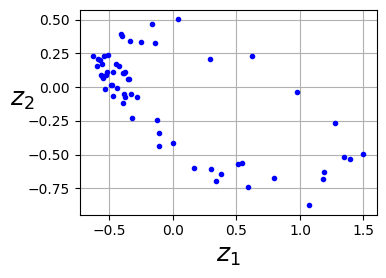

In [17]:
fig = plt.figure(figsize=(4, 3))
plt.plot(codings[:, 0], codings[:, 1], "b.")
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)
save_fig("linear_autoencoder_pca_plot")
plt.show()


### Staked Autoencoders

*Implementing a Staked Autoencoder Using Keras*


***Let's Load the fashion Mnist dataset, scale it and split it into a training set ,a validation set , and a test set:*** 

In [10]:
fashion_mnist = tf.keras.datasets.fashion_mnist.load_data()

(X_train_full, y_train_full), (X_test, y_test) = fashion_mnist

X_train_full = X_train_full.astype(np.float32)/255
X_test = X_test.astype(np.float32)/255

X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]


4422102/4422102 [==============================] - 0s 0us/step


In [9]:
tf.random.set_seed(42)

stacked_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(30, activation="relu"),
])
stacked_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28*28),
    tf.keras.layers.Reshape([28, 28])
])
staked_ae = tf.keras.Sequential([stacked_encoder, stacked_decoder])

staked_ae.compile(loss="mse", optimizer=tf.keras.optimizers.Nadam())
history = staked_ae.fit(X_train, X_train, epochs=30,
                        validation_data=(X_valid, X_valid))
staked_ae.summary()


I0000 00:00:1752337372.597958      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Epoch 1/30


I0000 00:00:1752337376.079489      80 service.cc:148] XLA service 0x7e3648642a90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1752337376.080112      80 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1752337376.153002      80 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1752337376.317672      80 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1719/1719 [==============================] - 9s 3ms/step - loss: 0.0231 - val_loss: 0.0179
Epoch 2/30
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0170 - val_loss: 0.0165
Epoch 3/30
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0160 - val_loss: 0.0159
Epoch 4/30
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0154 - val_loss: 0.0153
Epoch 5/30
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0149 - val_loss: 0.0150
Epoch 6/30
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0146 - val_loss: 0.0146
Epoch 7/30
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0144 - val_loss: 0.0146
Epoch 8/30
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0143 - val_loss: 0.0145
Epoch 9/30
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0141 - val_loss: 0.0143
Epoch 10/30
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0140 - val_los

#### Visualizing the Reconstructins 

In [10]:
import numpy as np


def plot_reconstructions(model, images=X_valid, n_images=5):
    reconstructions = np.clip(model.predict(images[:n_images]), 0, 1)
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plt.imshow(images[image_index], cmap="binary")
        plt.axis("off")
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plt.imshow(reconstructions[image_index], cmap="binary")
        plt.axis("off")


# plot_reconstructions(staked_ae)
save_fig("reconstruction_plot")  # extra code – saves the high res figure
plt.show()


<Figure size 640x480 with 0 Axes>

*the reconstruction look fussy , but remember that the images were compressed down to just 30 numbers ,instread of 784*

#### Visualizing the fashion MNIST Dataset 

In [11]:
from sklearn.manifold import TSNE

X_valid_compressed = stacked_encoder.predict(X_valid)
tsne = TSNE(init="pca", learning_rate="auto", random_state=42)
X_valid_2D = tsne.fit_transform(X_valid_compressed)


157/157 [==============================] - 0s 1ms/step


ValueError: Input X contains NaN.
TSNE does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [12]:
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap="tab10")
plt.show()


NameError: name 'X_valid_2D' is not defined

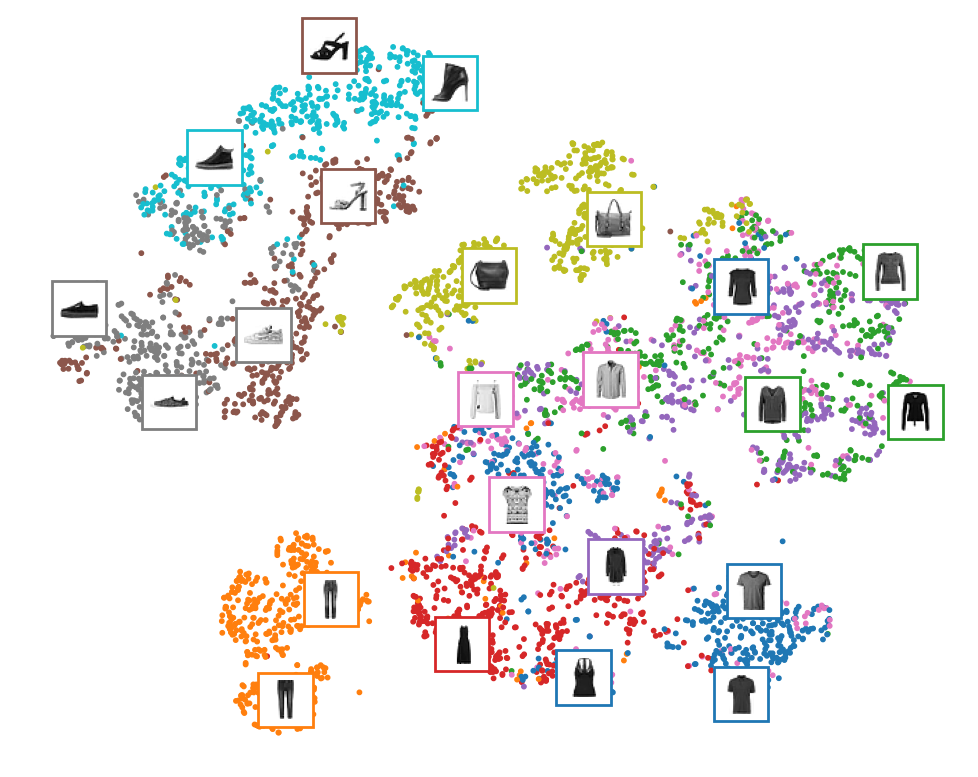

In [25]:
"""let's make this diagram a bit prettier"""
import matplotlib as mpl

plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
Z = X_valid_2D
Z = (Z - Z.min()) / (Z.max() - Z.min())  # normalize to the 0-1 range
plt.scatter(Z[:, 0], Z[:, 1], c=y_valid, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(Z):
    dist = ((position - image_positions) ** 2).sum(axis=1)
    if dist.min() > 0.02:  # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
        plt.gca().add_artist(imagebox)

plt.axis("off")
save_fig("fashion_mnist_visualization_plot")
plt.show()


### Tying Weights

In [7]:
class DenseTranspose(tf.keras.layers.Layer):
    def __init__(self, dense, activation=None, **kwargs):
        super().__init__(**kwargs)
        self.dense = dense
        self.activation = tf.keras.activations.get(activation)

    def build(self, batch_input_shape):
        self.biases = self.add_weight(name="bias",
                                      shape=self.dense.input_shape[-1],
                                      initializer="zeros")
        super().build(batch_input_shape)

    def call(self, inputs):
        Z = tf.matmul(inputs, self.dense.weights[0], transpose_b=True)
        return self.activation(Z+self.biases)


In [12]:
tf.random.set_seed(42)

dense_1 = tf.keras.layers.Dense(100, activation="relu")
dense_2 = tf.keras.layers.Dense(30, activation="relu")

tied_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    dense_1,
    dense_2
])

tied_decoder = tf.keras.Sequential([
    DenseTranspose(dense_2, activation="relu"),
    DenseTranspose(dense_1),
    tf.keras.layers.Reshape([28, 28])
])

tied_ae = tf.keras.Sequential([tied_encoder, tied_decoder])

tied_ae.compile(loss="mse", optimizer=tf.keras.optimizers.Nadam())

history = tied_ae.fit(X_train, X_train, epochs=10,
                      validation_data=(X_valid, X_valid))


Epoch 1/10


I0000 00:00:1751905176.061643     443 service.cc:148] XLA service 0x7f82a4ace330 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1751905176.062235     443 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1751905176.133236     443 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1751905176.303688     443 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1719/1719 [==============================] - 8s 3ms/step - loss: 0.0226 - val_loss: 0.0167
Epoch 2/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0158 - val_loss: 0.0152
Epoch 3/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0147 - val_loss: 0.0145
Epoch 4/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0143 - val_loss: 0.0143
Epoch 5/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0140 - val_loss: 0.0139
Epoch 6/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0138 - val_loss: 0.0138
Epoch 7/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0136 - val_loss: 0.0137
Epoch 8/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0135 - val_loss: 0.0135
Epoch 9/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0134 - val_loss: 0.0134
Epoch 10/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0132 - val_los

1/1 [==============================] - 0s 96ms/step


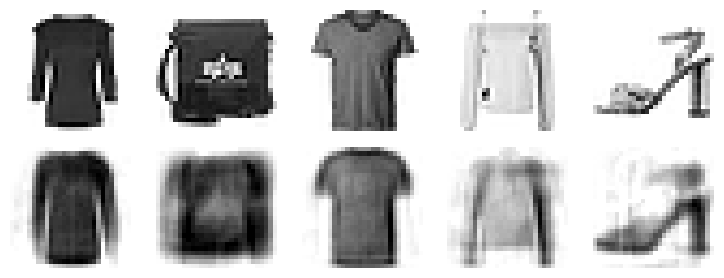

In [16]:
import numpy as np


def plot_reconstructions(model, images=X_valid, n_images=5):
    reconstructions = np.clip(model.predict(images[:n_images]), 0, 1)
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plt.imshow(images[image_index], cmap="binary")
        plt.axis("off")
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plt.imshow(reconstructions[image_index], cmap="binary")
        plt.axis("off")


plot_reconstructions(tied_ae)
save_fig("reconstruction_plot")  # extra code – saves the high res figure
plt.show()


### Training one Autoencoder at a time 

In [21]:
def train_autoencoder(n_neurons, X_train, X_valid, n_epochs=10,
                      output_activation=None, learning_rate=1e-3):
    n_inputs = X_train.shape[-1]
    encoder = tf.keras.layers.Dense(n_neurons, activation="relu")
    decoder = tf.keras.layers.Dense(n_inputs, activation=output_activation)
    autoencoder = tf.keras.Sequential([encoder, decoder])
    optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
    autoencoder.compile(loss="mse", optimizer=optimizer)
    autoencoder.fit(X_train, X_train, epochs=n_epochs,
                    validation_data=(X_valid, X_valid))
    return encoder, decoder, encoder(X_train), encoder(X_valid)


In [22]:
tf.random.set_seed(42)

X_train_flat = tf.keras.layers.Flatten()(X_train)
X_valid_flat = tf.keras.layers.Flatten()(X_valid)
enc1, dec1, X_train_enc1, X_valid_enc1 = train_autoencoder(
    100, X_train_flat, X_valid_flat, learning_rate=5e-4
)
enc2, dec2, _, _ = train_autoencoder(
    30, X_train_enc1, X_valid_enc1, output_activation="relu",
    learning_rate=5e-3
)


Epoch 1/10
1719/1719 [==============================] - 6s 3ms/step - loss: nan - val_loss: nan
Epoch 2/10
1719/1719 [==============================] - 4s 2ms/step - loss: nan - val_loss: nan
Epoch 3/10
1719/1719 [==============================] - 4s 2ms/step - loss: nan - val_loss: nan
Epoch 4/10
1719/1719 [==============================] - 4s 2ms/step - loss: nan - val_loss: nan
Epoch 5/10
1719/1719 [==============================] - 4s 2ms/step - loss: nan - val_loss: nan
Epoch 6/10
1719/1719 [==============================] - 4s 2ms/step - loss: nan - val_loss: nan
Epoch 7/10
1719/1719 [==============================] - 4s 2ms/step - loss: nan - val_loss: nan
Epoch 8/10
1719/1719 [==============================] - 4s 3ms/step - loss: nan - val_loss: nan
Epoch 9/10
1719/1719 [==============================] - 4s 2ms/step - loss: nan - val_loss: nan
Epoch 10/10
1719/1719 [==============================] - 4s 2ms/step - loss: nan - val_loss: nan
Epoch 1/10
1719/1719 [=================

In [26]:
staked_ae_1_by_1 = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    enc1, enc2, dec2, dec1,
    tf.keras.layers.Reshape([28, 28])
])


1/1 [==============================] - 0s 17ms/step


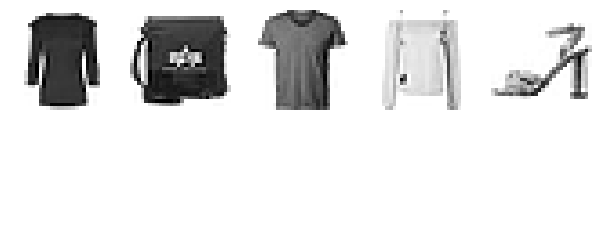

In [28]:
plot_reconstructions(staked_ae_1_by_1)
plt.show()


In [30]:
staked_ae_1_by_1.compile(loss="mse", optimizer=tf.keras.optimizers.Nadam())
history = staked_ae_1_by_1.fit(X_train, X_train, epochs=5,
                               validation_data=(X_valid, X_valid))


Epoch 1/5
1719/1719 [==============================] - 7s 3ms/step - loss: nan - val_loss: nan
Epoch 2/5
1719/1719 [==============================] - 5s 3ms/step - loss: nan - val_loss: nan
Epoch 3/5
1719/1719 [==============================] - 5s 3ms/step - loss: nan - val_loss: nan
Epoch 4/5
1719/1719 [==============================] - 5s 3ms/step - loss: nan - val_loss: nan
Epoch 5/5
1719/1719 [==============================] - 5s 3ms/step - loss: nan - val_loss: nan


1/1 [==============================] - 0s 77ms/step


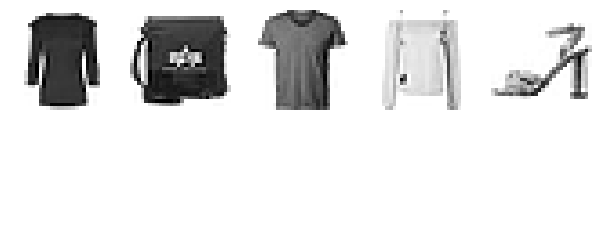

In [31]:
plot_reconstructions(staked_ae_1_by_1)
plt.show()


### Convolutional Autoencoders

In [35]:
tf.random.set_seed(42)

conv_encoder = tf.keras.Sequential([
    tf.keras.layers.Reshape([28, 28, 1]),
    tf.keras.layers.Conv2D(16, 3, padding="same", activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(32, 3, padding="same", activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(64, 3, padding="same", activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(30, 3, padding="same", activation="relu"),
    tf.keras.layers.GlobalAvgPool2D()

])

conv_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(3*3*16),
    tf.keras.layers.Reshape((3, 3, 16)),
    tf.keras.layers.Conv2DTranspose(32, 3, strides=2, activation="relu"),
    tf.keras.layers.Conv2DTranspose(
        16, 3, strides=2, padding="same", activation="relu"),
    tf.keras.layers.Conv2DTranspose(1, 3, strides=2, padding="same"),
    tf.keras.layers.Reshape([28, 28])
])

conv_ae = tf.keras.Sequential([conv_encoder, conv_decoder])

conv_ae.compile(loss="mse", optimizer=tf.keras.optimizers.Nadam())
history = conv_ae.fit(X_train, X_train, epochs=10,
                      validation_data=(X_valid, X_valid))


Epoch 1/10
1719/1719 [==============================] - 15s 6ms/step - loss: 0.0298 - val_loss: 0.0212
Epoch 2/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0190 - val_loss: 0.0183
Epoch 3/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0170 - val_loss: 0.0163
Epoch 4/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0159 - val_loss: 0.0154
Epoch 5/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0150 - val_loss: 0.0146
Epoch 6/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0144 - val_loss: 0.0140
Epoch 7/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0139 - val_loss: 0.0138
Epoch 8/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0135 - val_loss: 0.0138
Epoch 9/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0131 - val_loss: 0.0132
Epoch 10/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.01

1/1 [==============================] - 0s 281ms/step


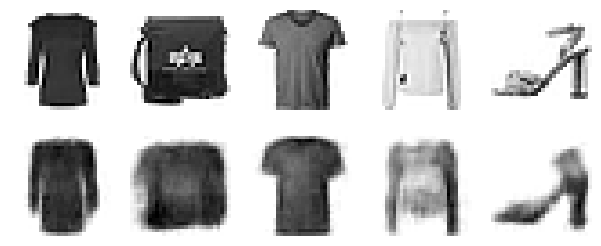

In [36]:
plot_reconstructions(conv_ae)
plt.show()


### Recurrent Autoencoders

*let's treat each Fashion MNIST image as a sequence of 28 vectors , each with 28 dimensions*

In [37]:
tf.random.set_seed(42)

recurrent_encoder = tf.keras.Sequential([
    tf.keras.layers.LSTM(100, return_sequences=True),
    tf.keras.layers.LSTM(30)
])
recurrent_decoder = tf.keras.Sequential([
    tf.keras.layers.RepeatVector(28),
    tf.keras.layers.LSTM(100, return_sequences=True),
    tf.keras.layers.Dense(28)
])

recurrent_ae = tf.keras.Sequential([recurrent_encoder, recurrent_decoder])
recurrent_ae.compile(loss="mse", optimizer=tf.keras.optimizers.Nadam())


In [38]:
history = recurrent_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))


Epoch 1/10
1719/1719 [==============================] - 31s 11ms/step - loss: 0.0264 - val_loss: 0.0196
Epoch 2/10
1719/1719 [==============================] - 17s 10ms/step - loss: 0.0175 - val_loss: 0.0166
Epoch 3/10
1719/1719 [==============================] - 17s 10ms/step - loss: 0.0153 - val_loss: 0.0152
Epoch 4/10
1719/1719 [==============================] - 17s 10ms/step - loss: 0.0140 - val_loss: 0.0135
Epoch 5/10
1719/1719 [==============================] - 17s 10ms/step - loss: 0.0131 - val_loss: 0.0127
Epoch 6/10
1719/1719 [==============================] - 17s 10ms/step - loss: 0.0123 - val_loss: 0.0119
Epoch 7/10
1719/1719 [==============================] - 17s 10ms/step - loss: 0.0118 - val_loss: 0.0121
Epoch 8/10
1719/1719 [==============================] - 17s 10ms/step - loss: 0.0113 - val_loss: 0.0111
Epoch 9/10
1719/1719 [==============================] - 17s 10ms/step - loss: 0.0109 - val_loss: 0.0115
Epoch 10/10
1719/1719 [==============================] - 17s 10m

### Denoising Autoencoders 

In [39]:
tf.random.set_seed(42)

dropout_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(30, activation="relu")
])
dropout_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28*28),
    tf.keras.layers.Reshape([28, 28])
])

dropout_ae = tf.keras.Sequential([dropout_encoder, dropout_decoder])

dropout_ae.compile(loss="mse", optimizer=tf.keras.optimizers.Nadam())
history = dropout_ae.fit(X_train, X_train, epochs=20,
                         validation_data=(X_valid, X_valid))


Epoch 1/20
1719/1719 [==============================] - 8s 3ms/step - loss: 0.0296 - val_loss: 0.0228
Epoch 2/20
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0231 - val_loss: 0.0208
Epoch 3/20
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0218 - val_loss: 0.0199
Epoch 4/20
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0210 - val_loss: 0.0192
Epoch 5/20
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0204 - val_loss: 0.0187
Epoch 6/20
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0200 - val_loss: 0.0185
Epoch 7/20
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0197 - val_loss: 0.0183
Epoch 8/20
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0195 - val_loss: 0.0178
Epoch 9/20
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0193 - val_loss: 0.0176
Epoch 10/20
1719/1719 [==============================] - 5s 3ms/step - loss: 0.019

1/1 [==============================] - 0s 94ms/step


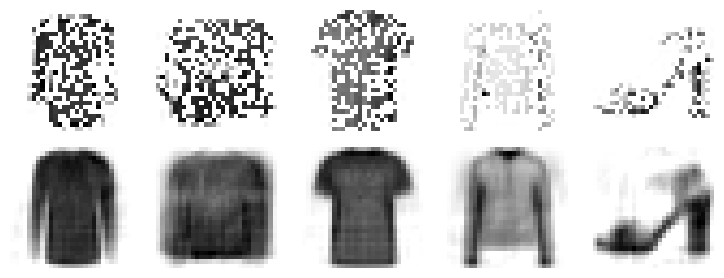

In [ ]:
# extra code – this cell generates and saves Figure 17–9
tf.random.set_seed(42)
dropout = tf.keras.layers.Dropout(0.5)
plot_reconstructions(dropout_ae, dropout(X_valid, training=True))
save_fig("dropout_denoising_plot")
plt.show()


1/1 [==============================] - 0s 31ms/step


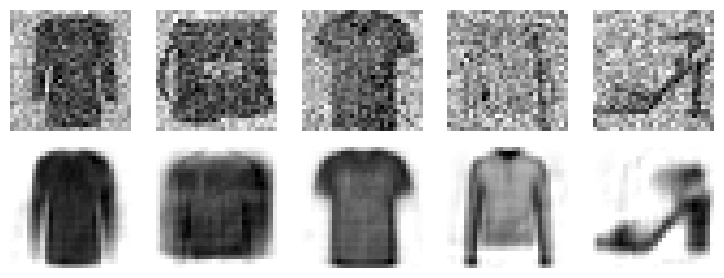

In [44]:
# extra code – this cell generates and saves Figure 17–9
tf.random.set_seed(42)
dropout = tf.keras.layers.GaussianNoise(0.2)
plot_reconstructions(dropout_ae, dropout(X_valid, training=True))
save_fig("dropout_denoising_plot")
plt.show()


### Sparse Autoencoders

In [15]:
sparse_l1_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(300, activation="sigmoid"),
    tf.keras.layers.ActivityRegularization(l1=1e-4)
])

sparse_l1_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28*28),
    tf.keras.layers.Reshape([28, 28])
])
sparse_l1_ae = tf.keras.Sequential([sparse_11_encoder, sparse_l1_decoder])
sparse_l1_ae.compile(loss="mse", optimizer=tf.keras.optimizers.Nadam())

history = sparse_l1_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))


Epoch 1/10
1719/1719 [==============================] - 8s 3ms/step - loss: 0.0281 - val_loss: 0.0194
Epoch 2/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0173 - val_loss: 0.0168
Epoch 3/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0150 - val_loss: 0.0146
Epoch 4/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0139 - val_loss: 0.0134
Epoch 5/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0131 - val_loss: 0.0129
Epoch 6/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0125 - val_loss: 0.0123
Epoch 7/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0121 - val_loss: 0.0121
Epoch 8/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0118 - val_loss: 0.0118
Epoch 9/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0115 - val_loss: 0.0115
Epoch 10/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.011

1/1 [==============================] - 0s 88ms/step


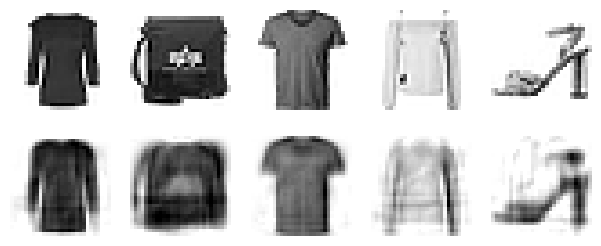

In [16]:
# extra code – shows the reconstructions
plot_reconstructions(sparse_l1_ae)
plt.show()


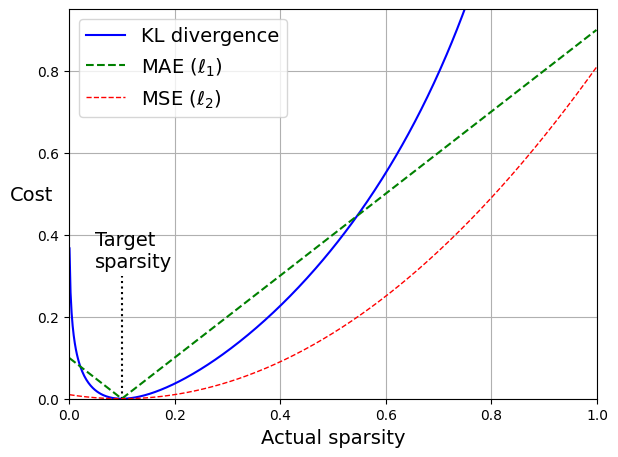

In [17]:
# extra code – this cell generates and saves Figure 17–10
p = 0.1
q = np.linspace(0.001, 0.999, 500)
kl_div = p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))
mse = (p - q) ** 2
mae = np.abs(p - q)
plt.plot([p, p], [0, 0.3], "k:")
plt.text(0.05, 0.32, "Target\nsparsity", fontsize=14)
plt.plot(q, kl_div, "b-", label="KL divergence")
plt.plot(q, mae, "g--", label=r"MAE ($\ell_1$)")
plt.plot(q, mse, "r--", linewidth=1, label=r"MSE ($\ell_2$)")
plt.legend(loc="upper left", fontsize=14)
plt.xlabel("Actual sparsity")
plt.ylabel("Cost", rotation=0)
plt.axis([0, 1, 0, 0.95])
plt.grid(True)
save_fig("sparsity_loss_plot")


*let's define a custom regularizer for KL-Divergence regularization*

**KL Divergence helps VAEs learn a neat and well-organized latent space by comparing it to a normal distribution.**

In [18]:
kl_divergence = tf.keras.losses.kullback_leibler_divergence


class KLDivergenceRegularizer(tf.keras.regularizers.Regularizer):
    def __init__(self, weight, target):
        self.weight = weight
        self.target = target

    def __call__(self, inputs):
        mean_activities = tf.reduce_mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) +
            kl_divergence(1. - self.target, 1. - mean_activities)
        )


In [19]:
tf.random.set_seed(42)

kld_reg = KLDivergenceRegularizer(weight=5e-3, target=0.1)
sparse_kl_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(300, activation="sigmoid",
                          activity_regularizer=kld_reg)
])
sparse_kl_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28*28),
    tf.keras.layers.Reshape([28, 28])
])

sparse_kl_ae = tf.keras.Sequential([sparse_kl_encoder, sparse_kl_decoder])

sparse_kl_ae.compile(loss="mse", optimizer=tf.keras.optimizers.Nadam())
history = sparse_kl_ae.fit(X_valid, X_valid, epochs=10,
                           validation_data=(X_valid, X_valid))


Epoch 1/10
157/157 [==============================] - 5s 7ms/step - loss: 0.0639 - val_loss: 0.0358
Epoch 2/10
157/157 [==============================] - 1s 5ms/step - loss: 0.0306 - val_loss: 0.0280
Epoch 3/10
157/157 [==============================] - 1s 5ms/step - loss: 0.0262 - val_loss: 0.0246
Epoch 4/10
157/157 [==============================] - 1s 5ms/step - loss: 0.0238 - val_loss: 0.0228
Epoch 5/10
157/157 [==============================] - 1s 5ms/step - loss: 0.0222 - val_loss: 0.0214
Epoch 6/10
157/157 [==============================] - 1s 6ms/step - loss: 0.0210 - val_loss: 0.0203
Epoch 7/10
157/157 [==============================] - 1s 5ms/step - loss: 0.0201 - val_loss: 0.0195
Epoch 8/10
157/157 [==============================] - 1s 5ms/step - loss: 0.0191 - val_loss: 0.0187
Epoch 9/10
157/157 [==============================] - 1s 5ms/step - loss: 0.0184 - val_loss: 0.0182
Epoch 10/10
157/157 [==============================] - 1s 5ms/step - loss: 0.0176 - val_loss: 0.0179

1/1 [==============================] - 0s 122ms/step


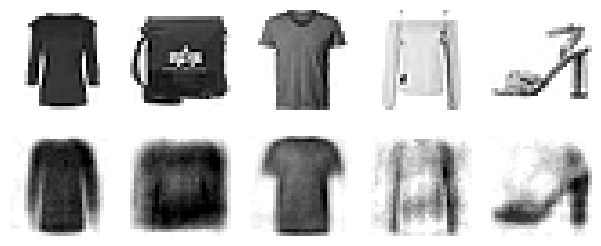

In [20]:
# extra code – shows the reconstructions
plot_reconstructions(sparse_kl_ae)
plt.show()


### variational Autoencoders

In [26]:
class Sampling(tf.keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return tf.random.normal(tf.shape(log_var)) * tf.exp(log_var/2)+mean


In [27]:
tf.random.set_seed(42)

codings_size = 10

inputs = tf.keras.layers.Input(shape=[28, 28])
Z = tf.keras.layers.Flatten()(inputs)
Z = tf.keras.layers.Dense(150, activation="relu")(Z)
Z = tf.keras.layers.Dense(100, activation="relu")(Z)

codings_mean = tf.keras.layers.Dense(codings_size)(Z)

coding_log_var = tf.keras.layers.Dense(codings_size)(Z)

codings = Sampling()([codings_mean, coding_log_var])

variational_encoder = tf.keras.Model(
    inputs=[inputs], outputs=[codings_mean, coding_log_var, codings]
)


In [28]:
decoder_inputs = tf.keras.layers.Input(shape=[codings_size])
x = tf.keras.layers.Dense(100, activation="relu")(decoder_inputs)
x = tf.keras.layers.Dense(150, activation="relu")(x)
x = tf.keras.layers.Dense(28*28)(x)
outputs = tf.keras.layers.Reshape([28, 28])(x)
variational_decoder = tf.keras.Model(
    inputs=[decoder_inputs], outputs=[outputs])


In [29]:
_, _, codings = variational_encoder(inputs)
reconstructions = variational_decoder(codings)
variational_ar = tf.keras.Model(inputs=[inputs], outputs=[reconstructions])


In [30]:
latent_loss = -0.5*tf.reduce_sum(
    1 + coding_log_var - tf.exp(coding_log_var)-tf.square(codings_mean),
    axis=-1
)
variational_ar.add_loss(tf.reduce_mean(latent_loss)/784.)


In [31]:
variational_ar.compile(loss="mse", optimizer=tf.keras.optimizers.Nadam())
history = variational_ar.fit(X_train, X_train, epochs=25, batch_size=128,
                             validation_data=(X_valid, X_valid))


Epoch 1/25
430/430 [==============================] - 7s 6ms/step - loss: 0.0511 - val_loss: 0.0388
Epoch 2/25
430/430 [==============================] - 2s 5ms/step - loss: 0.0367 - val_loss: 0.0359
Epoch 3/25
430/430 [==============================] - 2s 5ms/step - loss: 0.0349 - val_loss: 0.0348
Epoch 4/25
430/430 [==============================] - 2s 5ms/step - loss: 0.0340 - val_loss: 0.0340
Epoch 5/25
430/430 [==============================] - 2s 5ms/step - loss: 0.0334 - val_loss: 0.0335
Epoch 6/25
430/430 [==============================] - 2s 5ms/step - loss: 0.0330 - val_loss: 0.0334
Epoch 7/25
430/430 [==============================] - 2s 5ms/step - loss: 0.0327 - val_loss: 0.0329
Epoch 8/25
430/430 [==============================] - 2s 5ms/step - loss: 0.0324 - val_loss: 0.0325
Epoch 9/25
430/430 [==============================] - 2s 5ms/step - loss: 0.0322 - val_loss: 0.0325
Epoch 10/25
430/430 [==============================] - 2s 5ms/step - loss: 0.0320 - val_loss: 0.0324

### Generate Fashion Images

In [32]:
tf.random.set_seed(42)  # extra code – ensures reproducibility on CPU

codings = tf.random.normal(shape=[3 * 7, codings_size])
images = variational_decoder(codings).numpy()


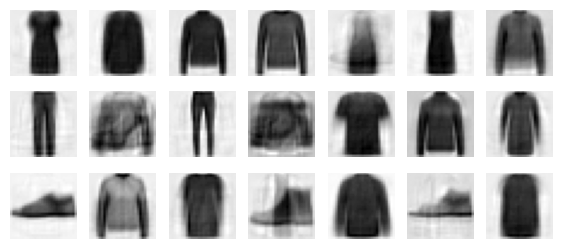

In [33]:
# extra code – this cells generates and saves Figure 17-12

def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = images.squeeze(axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")


plot_multiple_images(images, 7)
save_fig("vae_generated_images_plot", tight_layout=False)
plt.show()


In [38]:
tf.random.set_seed(42)  # extra code – ensures reproducibility on CPU

codings = np.zeros([7, codings_size])
codings[:, 3] = np.linspace(-0.8, 0.8, 7)  # axis 3 looks best in this case
images = variational_decoder(codings).numpy()


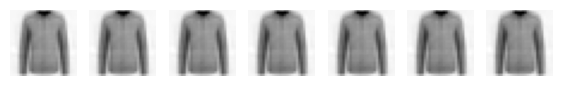

In [39]:
# extra code – this cell generates and saves Figure 17–13
plot_multiple_images(images)
save_fig("semantic_interpolation_plot", tight_layout=False)
plt.show()


### Generative Adversarial Networks

In [18]:
tf.random.set_seed(42)  # extra code – ensures reproducibility on CPU

codings = tf.random.normal(shape=[3 * 7, codings_size])
images = variational_decoder(codings).numpy()


NameError: name 'codings_size' is not defined

In [19]:
# extra code – this cells generates and saves Figure 17-12

def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = images.squeeze(axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")


plot_multiple_images(images, 7)
save_fig("vae_generated_images_plot", tight_layout=False)
plt.show()


NameError: name 'images' is not defined

In [19]:
tf.random.set_seed(42)

codings_size = 30

Dense = tf.keras.layers.Dense

generator = tf.keras.Sequential([
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(28*28, activation="sigmoid"),
    tf.keras.layers.Reshape([28, 28])
])

discriminator = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(1, activation="sigmoid")
])
gan = tf.keras.Sequential([generator, discriminator])


In [20]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")

discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")


In [21]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)


Epoch 1/50


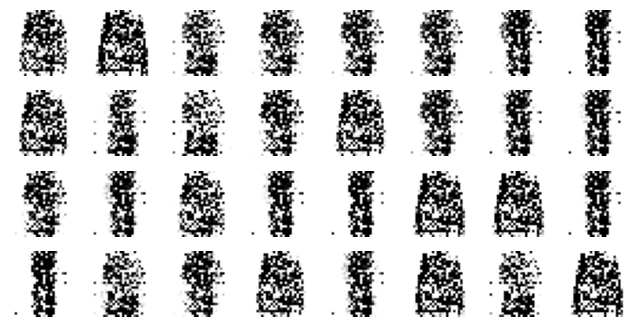

Epoch 2/50


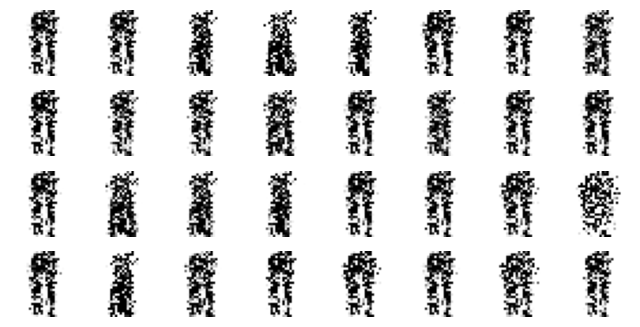

Epoch 3/50


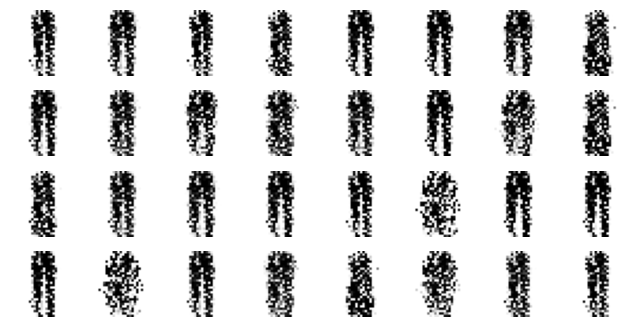

Epoch 4/50


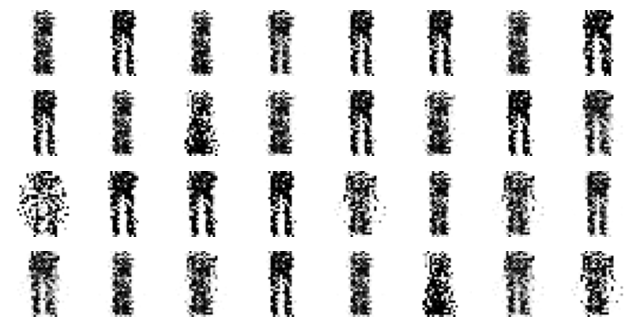

Epoch 5/50


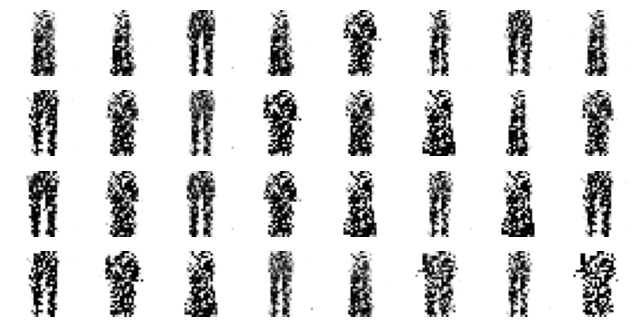

Epoch 6/50


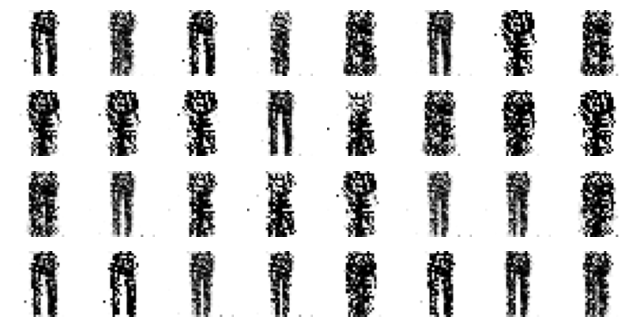

Epoch 7/50


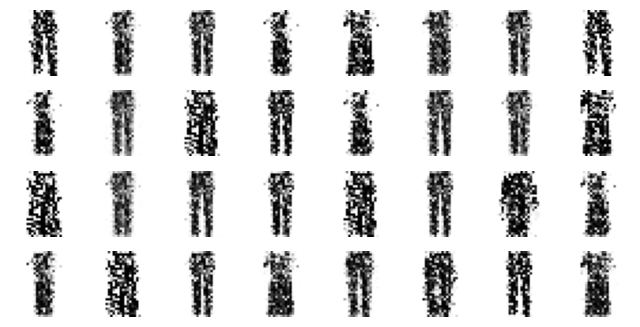

Epoch 8/50


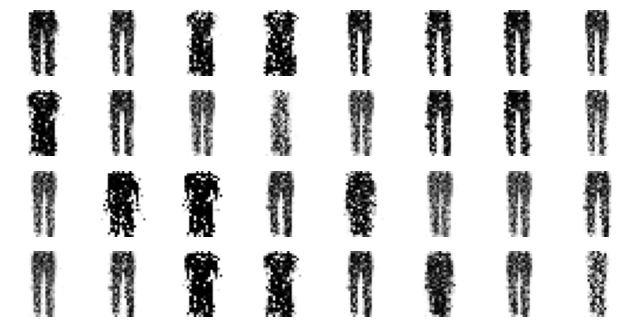

Epoch 9/50


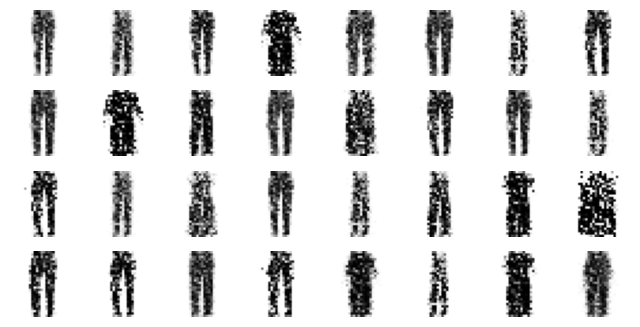

Epoch 10/50


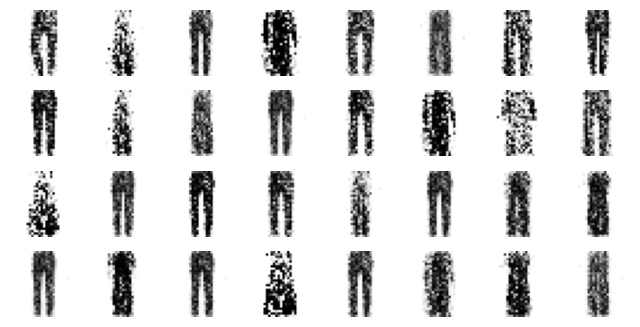

Epoch 11/50


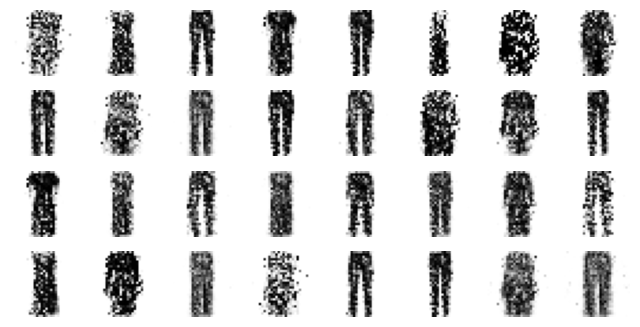

Epoch 12/50


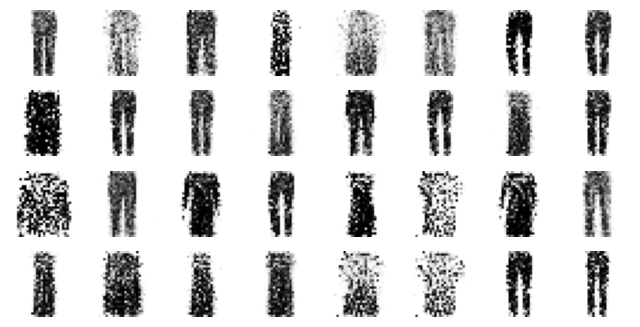

Epoch 13/50


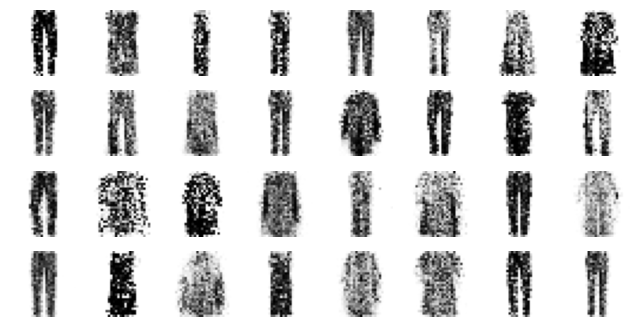

Epoch 14/50


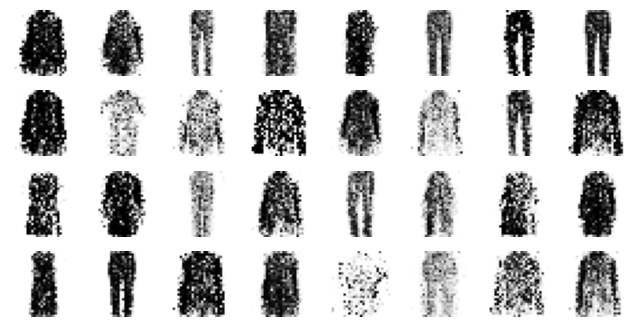

Epoch 15/50


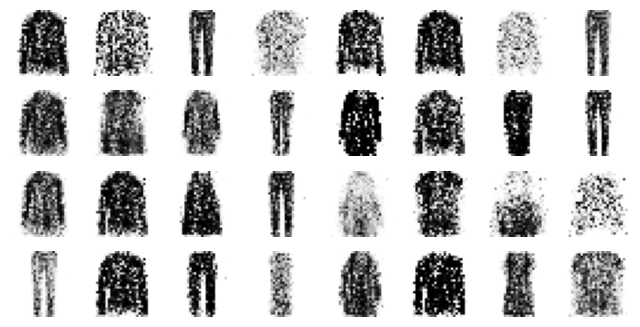

Epoch 16/50


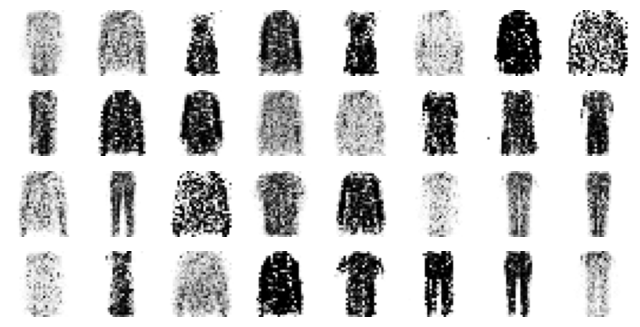

Epoch 17/50


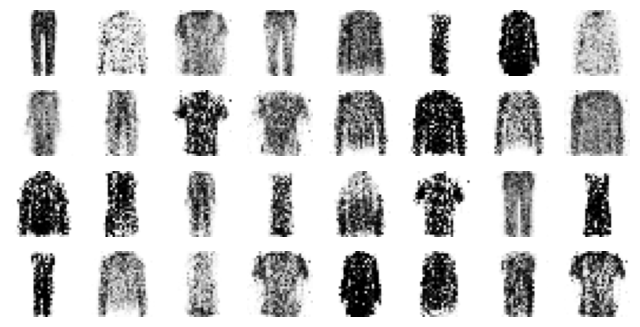

Epoch 18/50


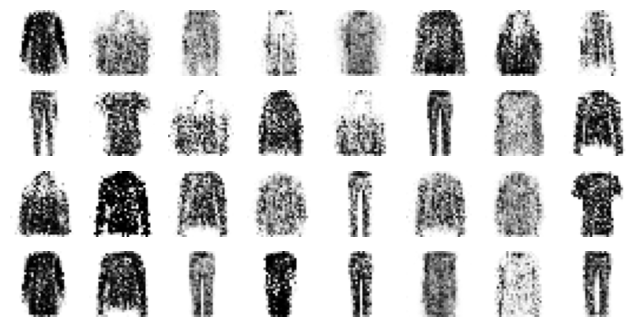

Epoch 19/50


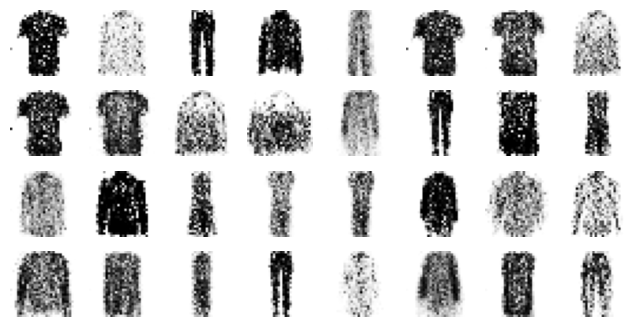

Epoch 20/50


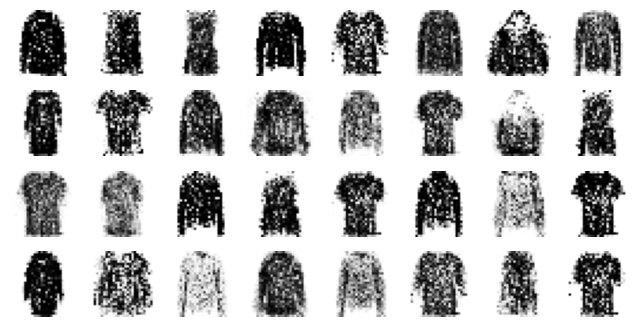

Epoch 21/50


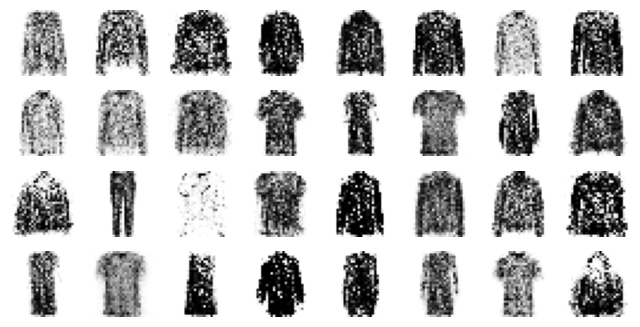

Epoch 22/50


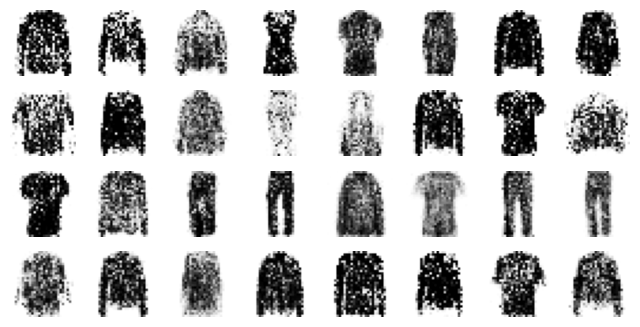

Epoch 23/50


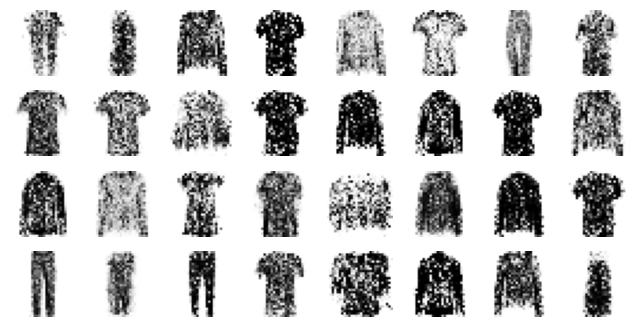

Epoch 24/50


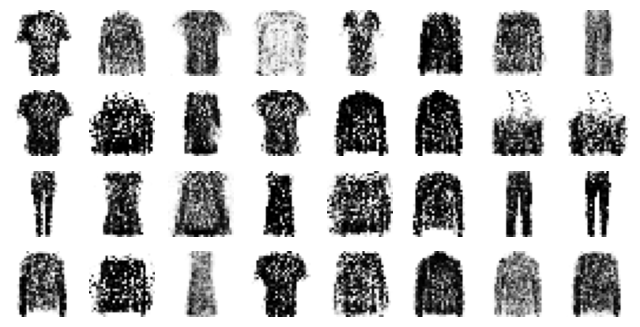

Epoch 25/50


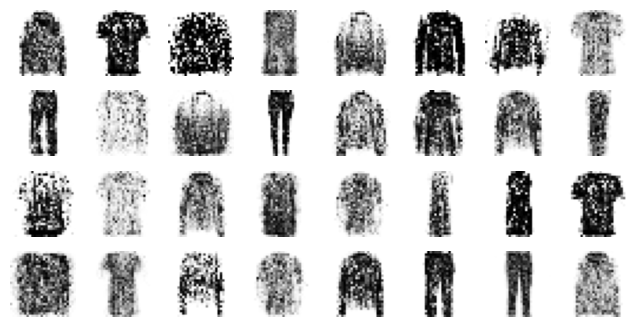

Epoch 26/50


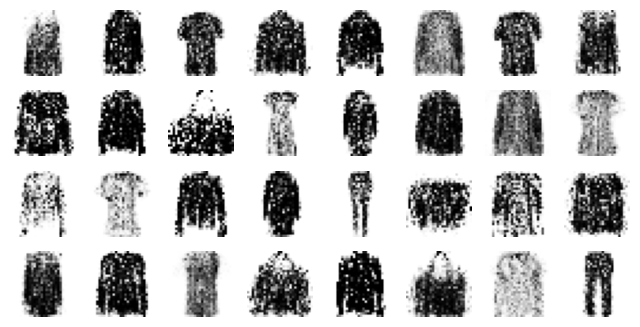

Epoch 27/50


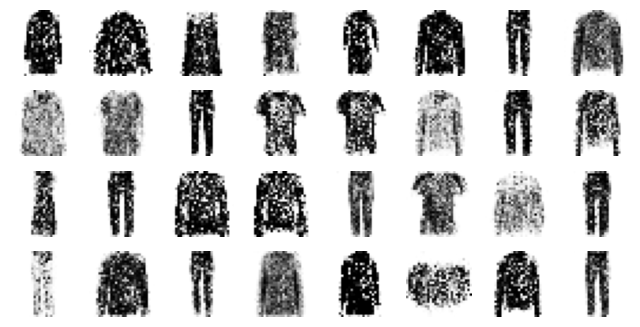

Epoch 28/50


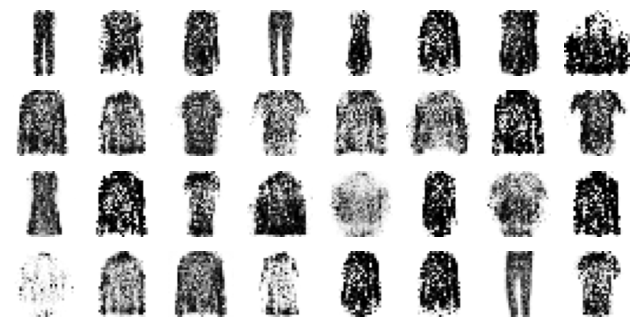

Epoch 29/50


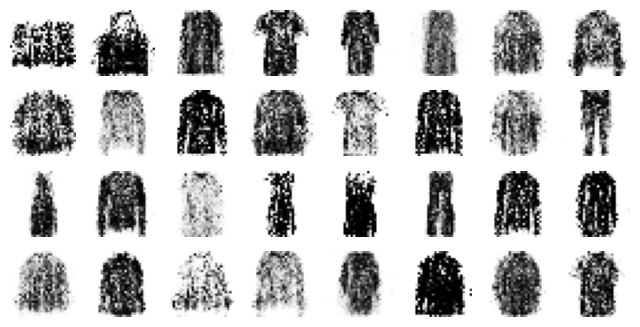

Epoch 30/50


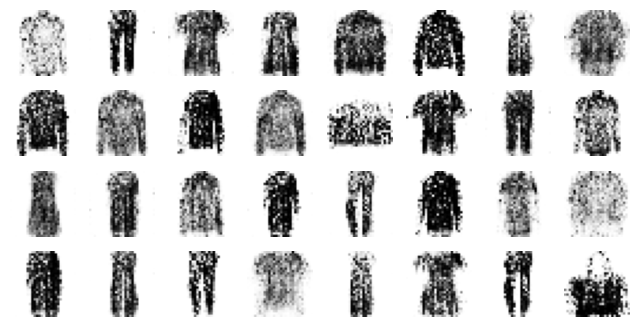

Epoch 31/50


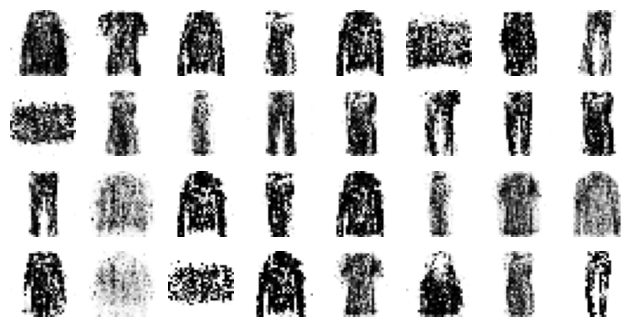

Epoch 32/50


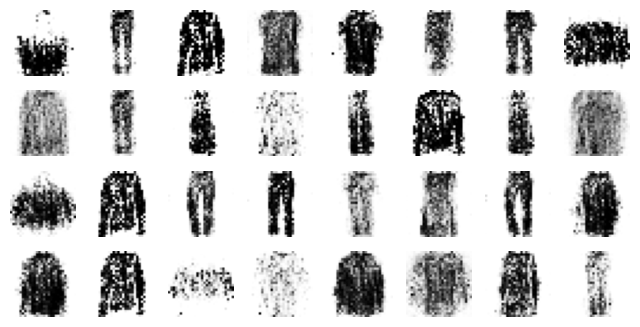

Epoch 33/50


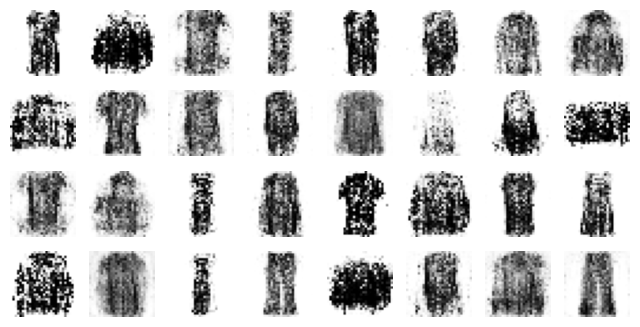

Epoch 34/50


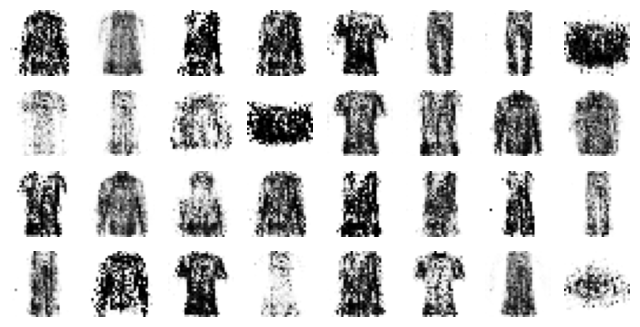

Epoch 35/50


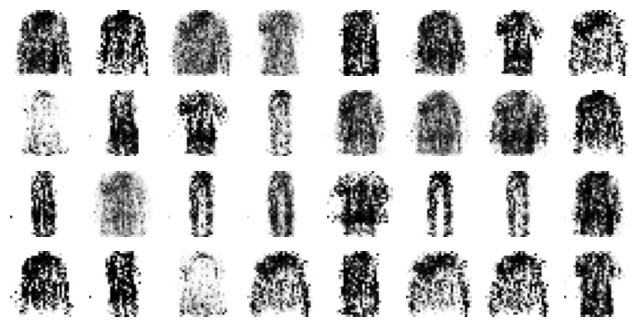

Epoch 36/50


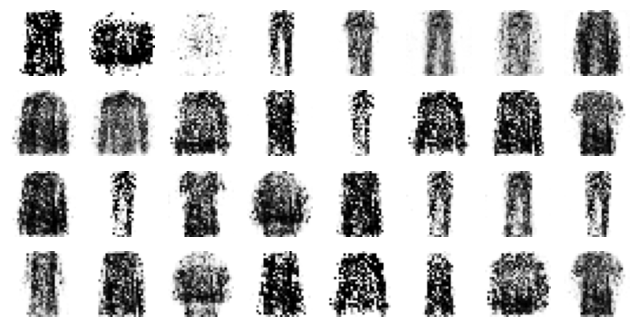

Epoch 37/50


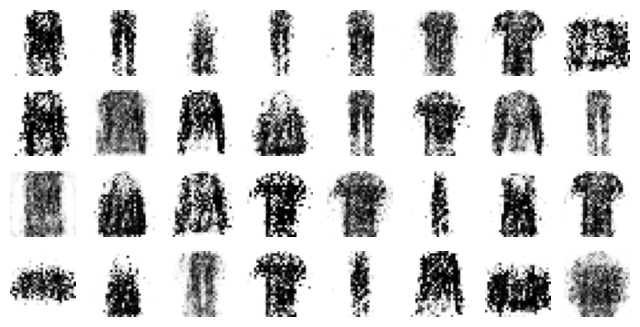

Epoch 38/50


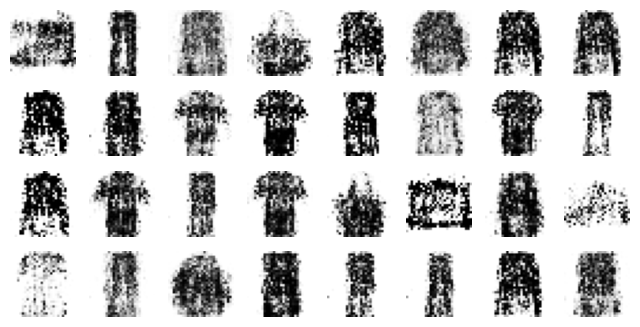

Epoch 39/50


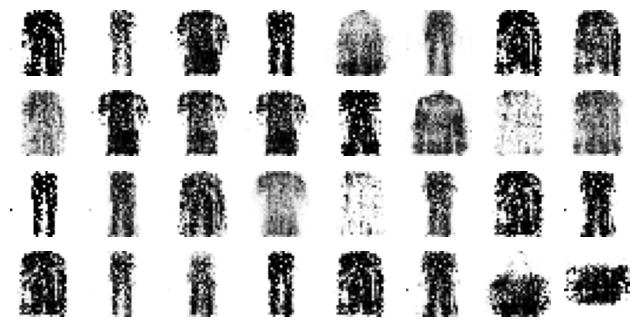

Epoch 40/50


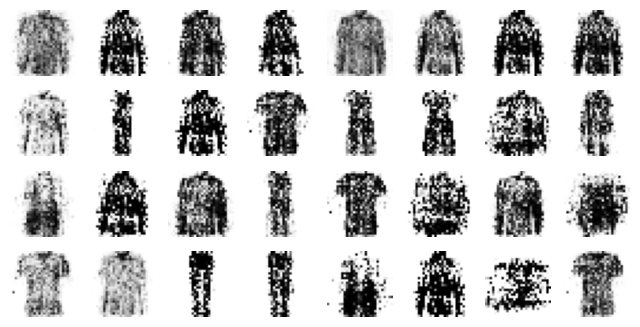

Epoch 41/50


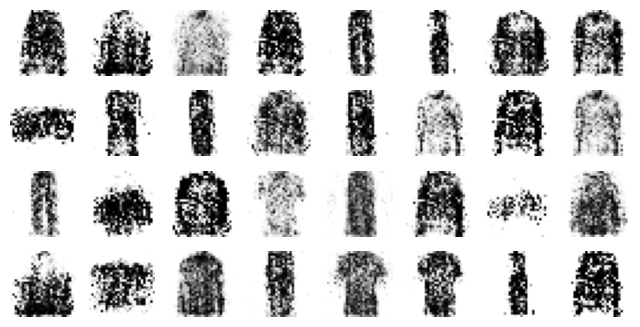

Epoch 42/50


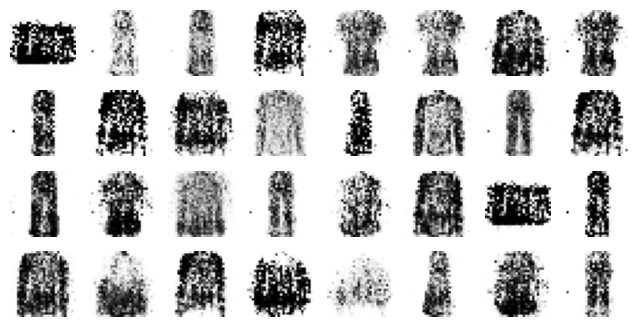

Epoch 43/50


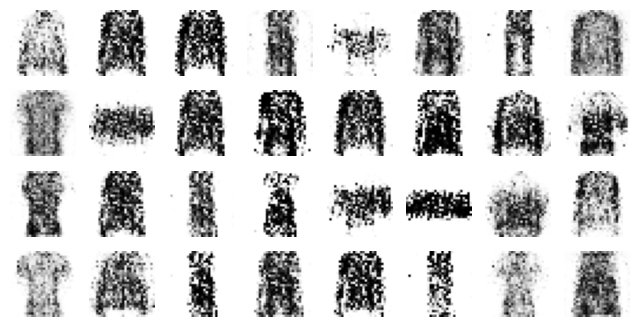

Epoch 44/50


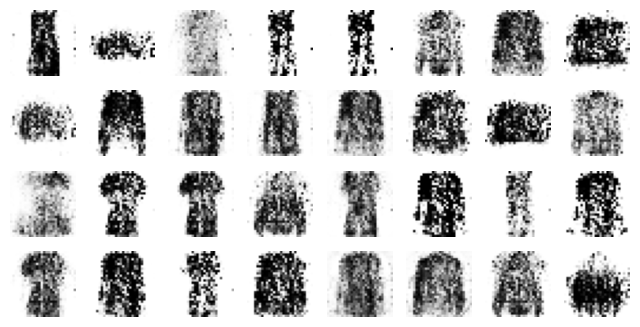

Epoch 45/50


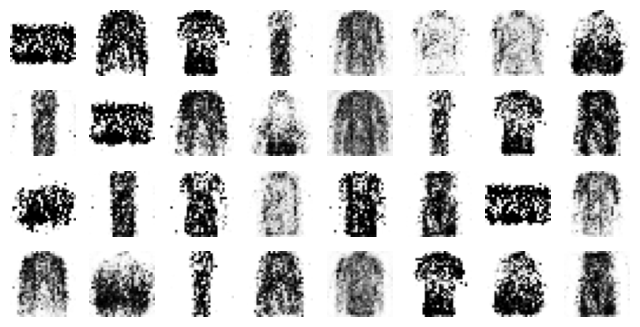

Epoch 46/50


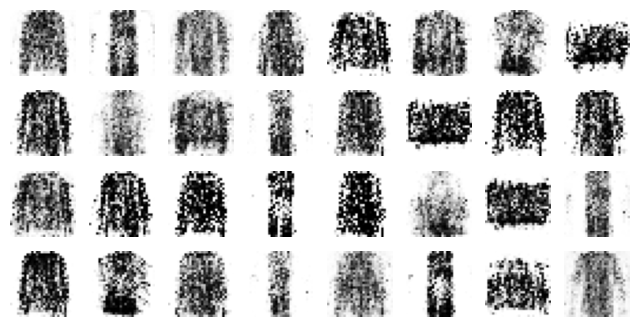

Epoch 47/50


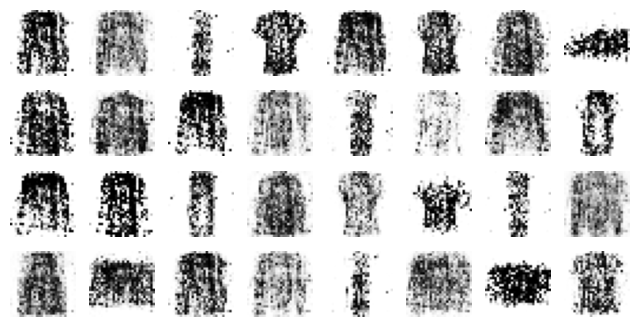

Epoch 48/50


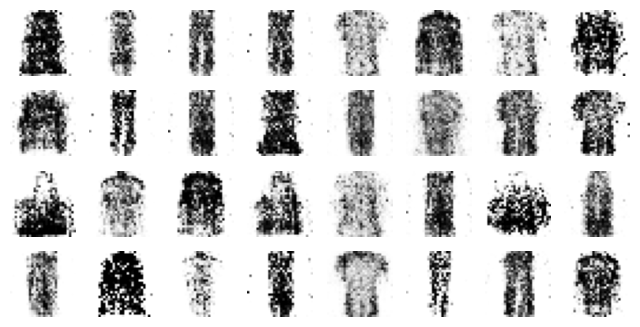

Epoch 49/50


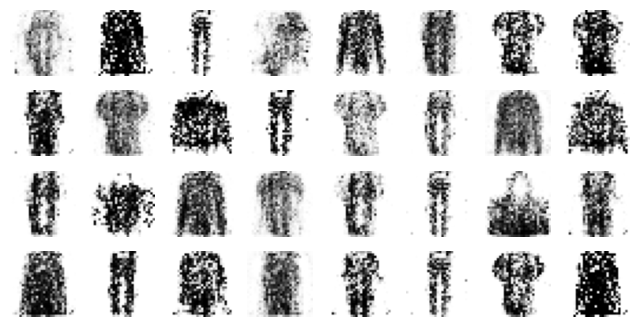

Epoch 50/50


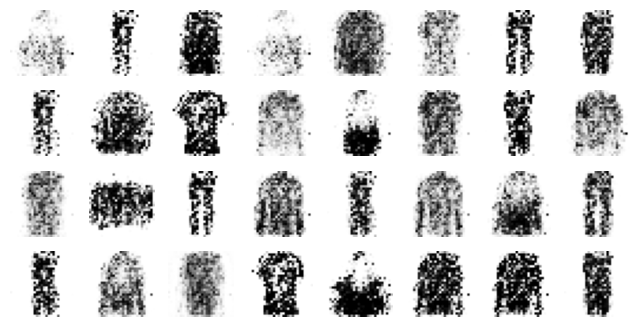

In [22]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print(f"Epoch {epoch + 1}/{n_epochs}")  # extra code
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            gan.train_on_batch(noise, y2)
        # extra code — plot images during training
        plot_multiple_images(generated_images.numpy(), 8)
        plt.show()


train_gan(gan, dataset, batch_size, codings_size, n_epochs=50)


In [23]:
tf.random.set_seed(42)

codings = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator.predict(codings)


1/1 [==============================] - 0s 101ms/step


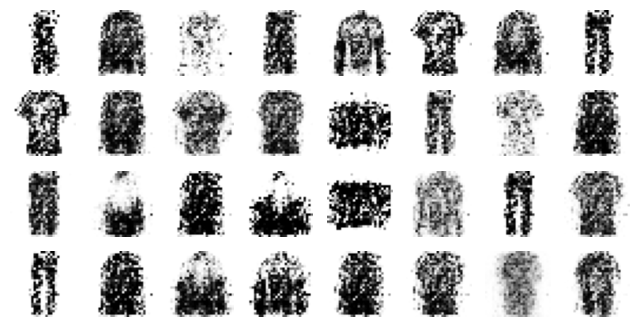

In [24]:
plot_multiple_images(generated_images, 8)
save_fig("gan_generated_images_plot", tight_layout=False)
plt.show()


### Deep Convolutional GAN

In [25]:
tf.random.set_seed(42)

codings_size = 100

generator = tf.keras.Sequential([
    tf.keras.layers.Dense(7*7*128),
    tf.keras.layers.Reshape([7, 7, 128]),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(
        64, kernel_size=5, strides=2, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(
        1, kernel_size=5, strides=2, padding="same", activation="tanh"),


])

discriminator = tf.keras.Sequential([

    tf.keras.layers.Conv2D(64, kernel_size=5, strides=2,
                           padding="same", activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Conv2D(64, kernel_size=5, strides=2,
                           padding="same", activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

gan = tf.keras.Sequential([generator, discriminator])


In [27]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")

discriminator.trainable = False

gan.compile(loss="binary_crossentropy", optimizer="rmsprop")


In [28]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1)*2. - 1.


Epoch 1/50


E0000 00:00:1752340298.707501      36 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_7/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


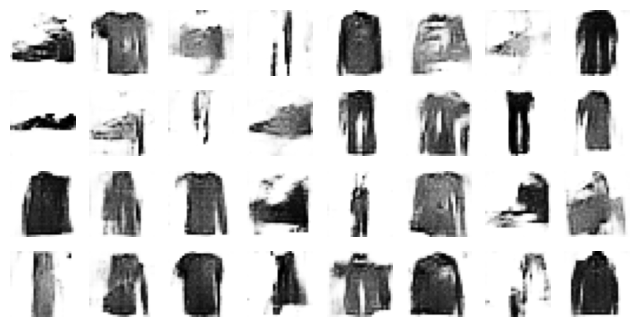

Epoch 2/50


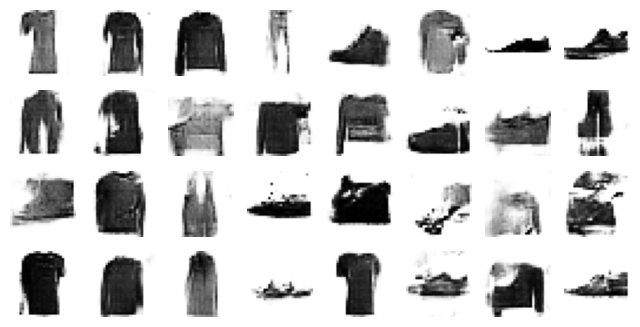

Epoch 3/50


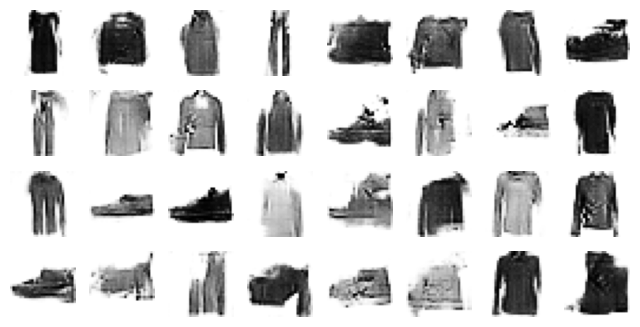

Epoch 4/50


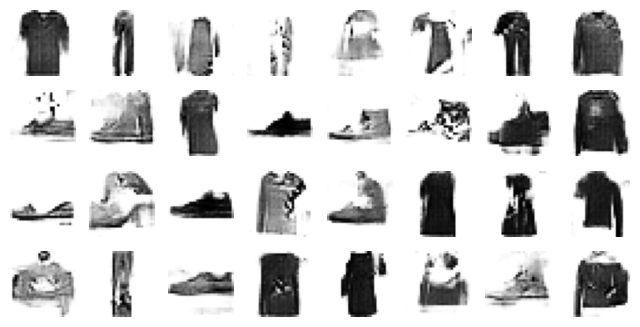

Epoch 5/50


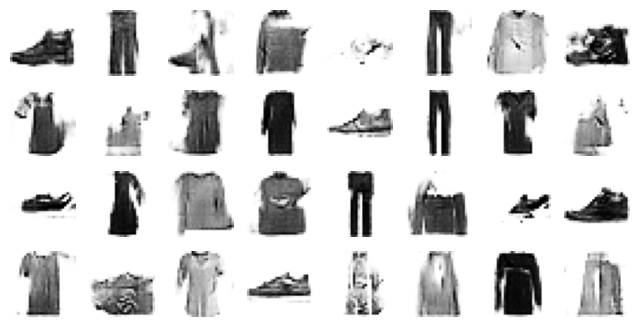

Epoch 6/50


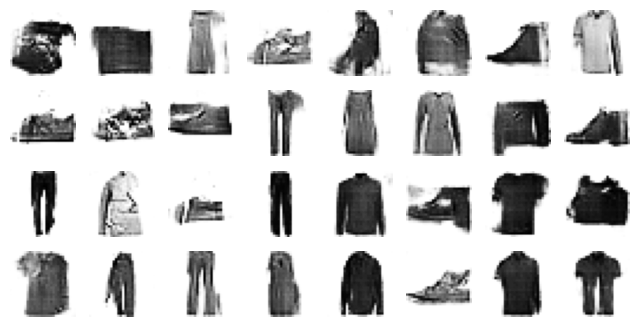

Epoch 7/50


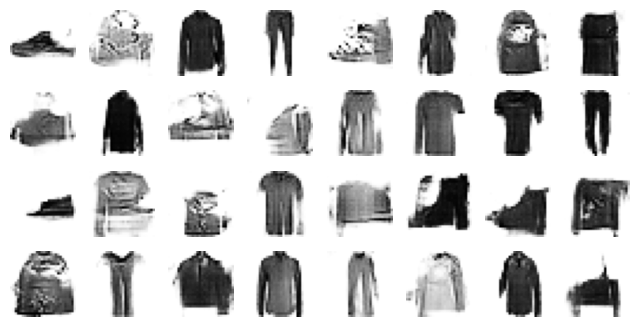

Epoch 8/50


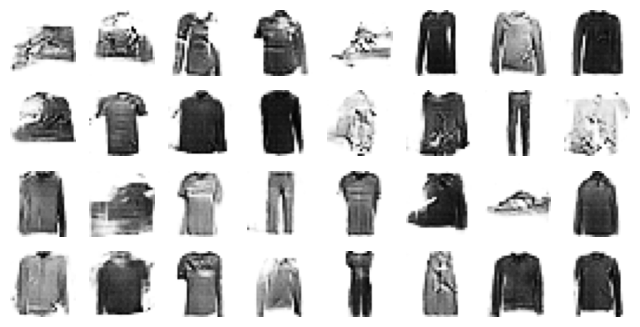

Epoch 9/50


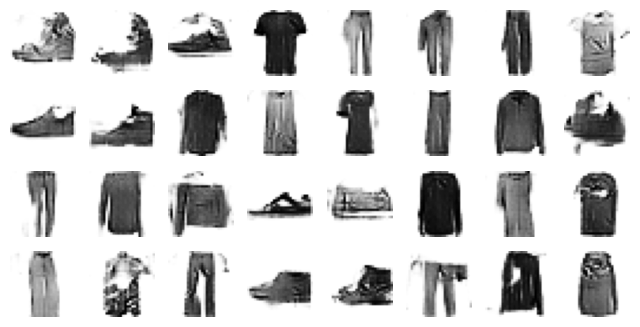

Epoch 10/50


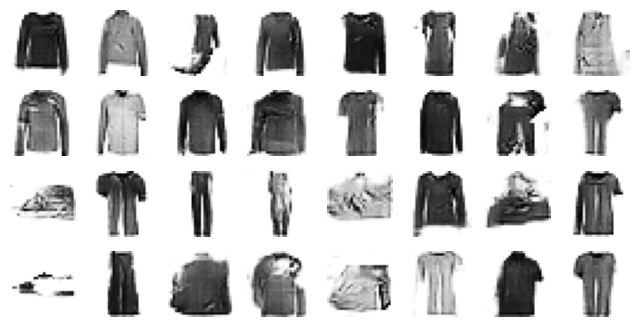

Epoch 11/50


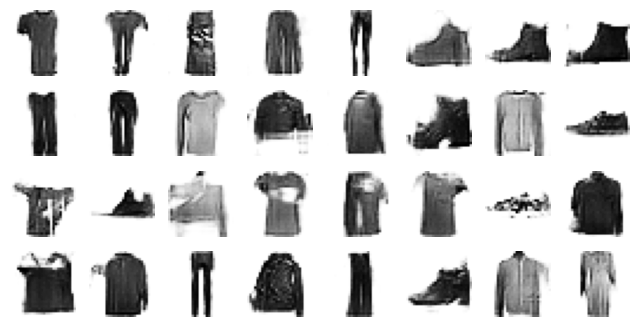

Epoch 12/50


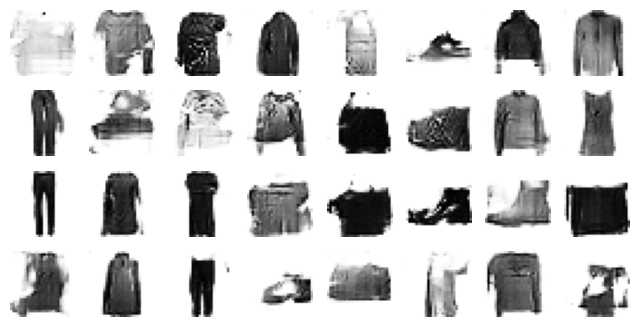

Epoch 13/50


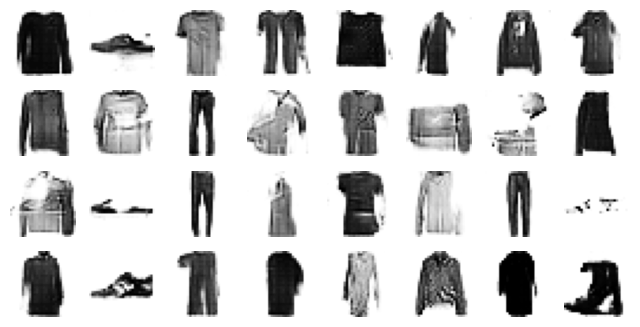

Epoch 14/50


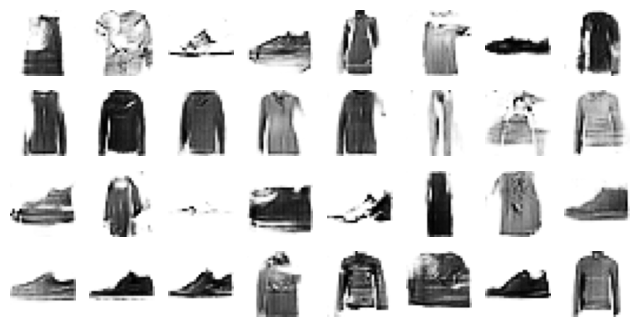

Epoch 15/50


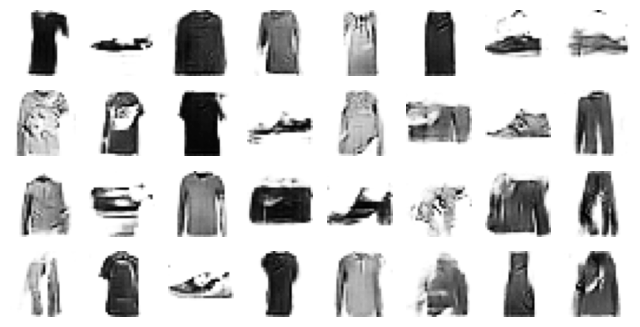

Epoch 16/50


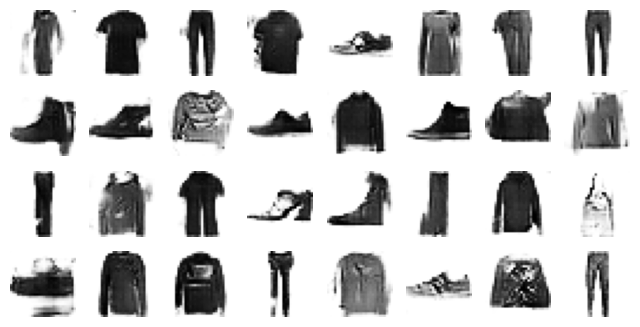

Epoch 17/50


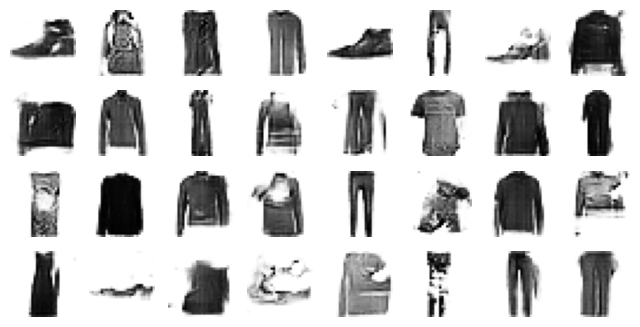

Epoch 18/50


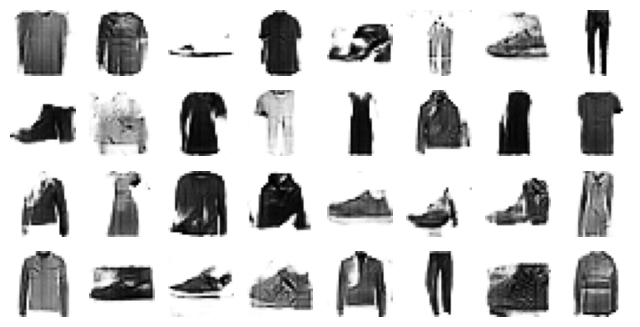

Epoch 19/50


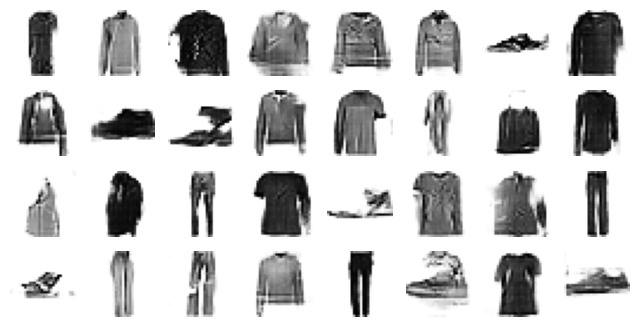

Epoch 20/50


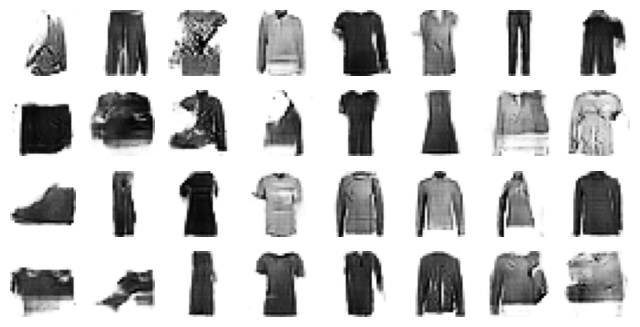

Epoch 21/50


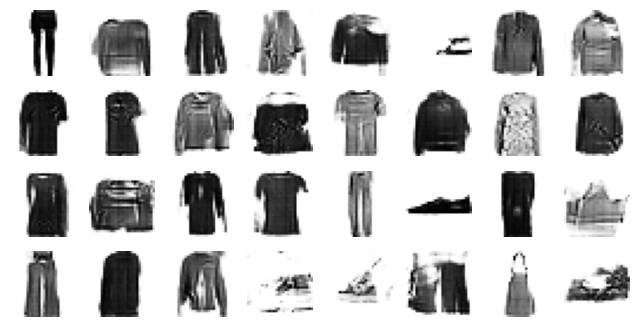

Epoch 22/50


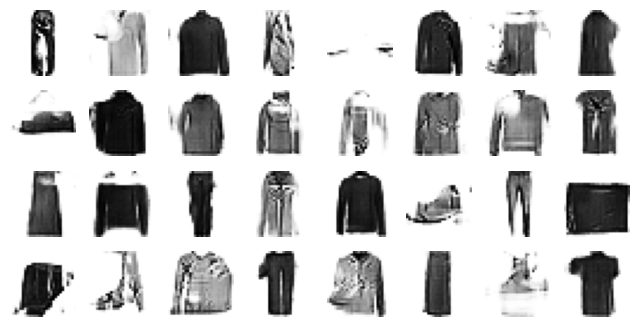

Epoch 23/50


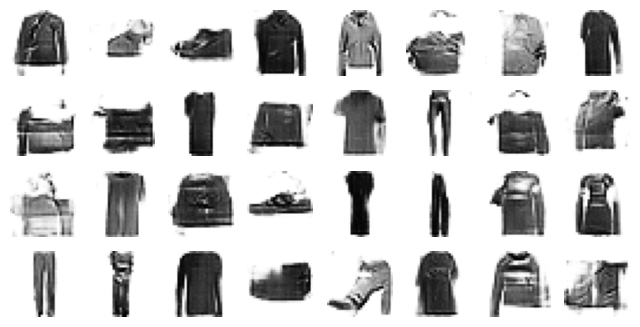

Epoch 24/50


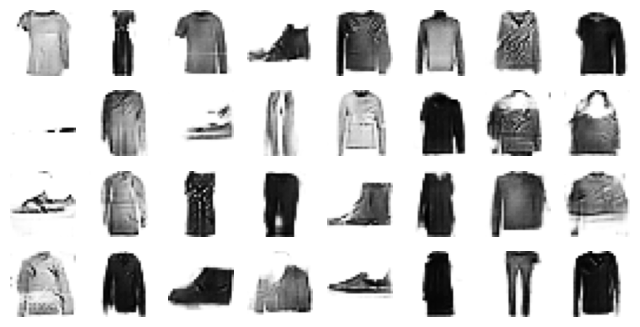

Epoch 25/50


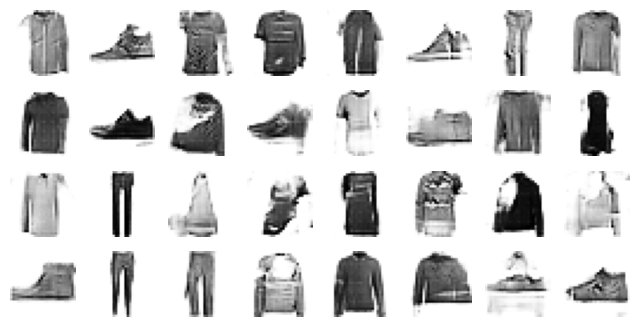

Epoch 26/50


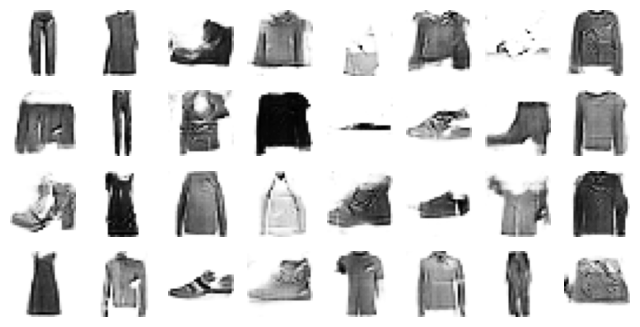

Epoch 27/50


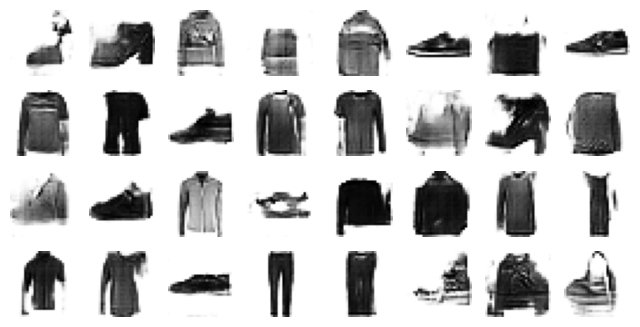

Epoch 28/50


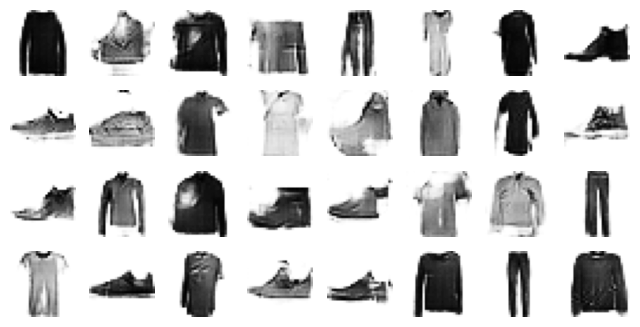

Epoch 29/50


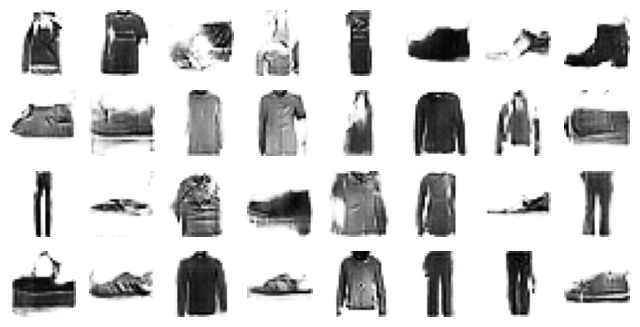

Epoch 30/50


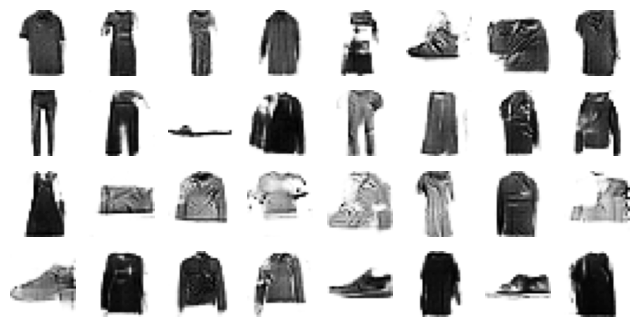

Epoch 31/50


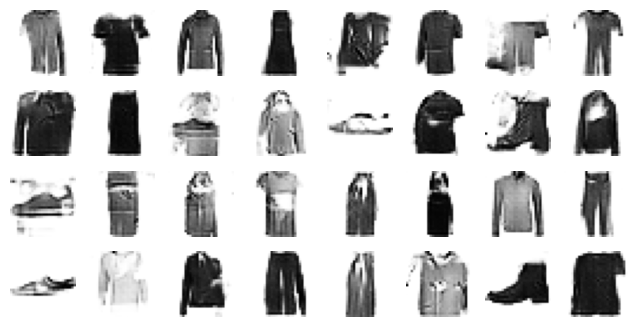

Epoch 32/50


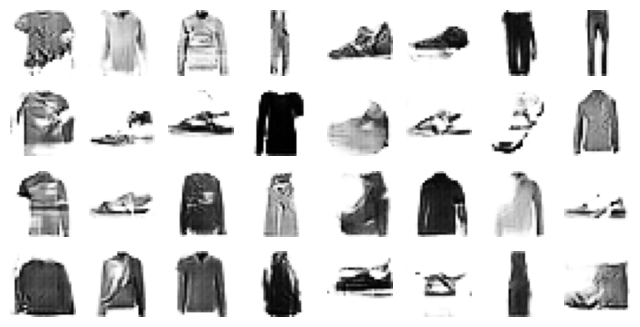

Epoch 33/50


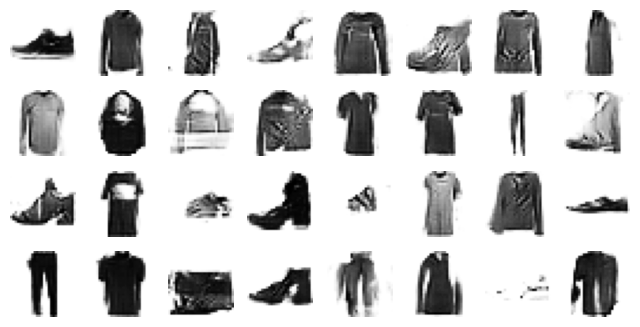

Epoch 34/50


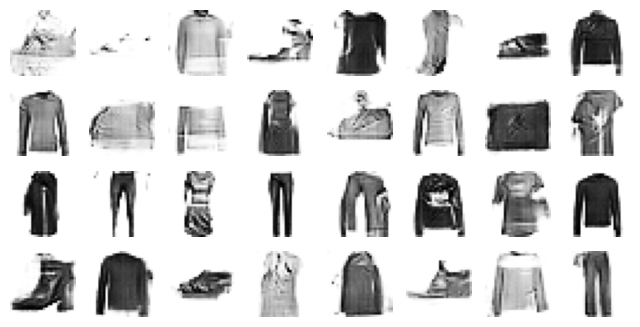

Epoch 35/50


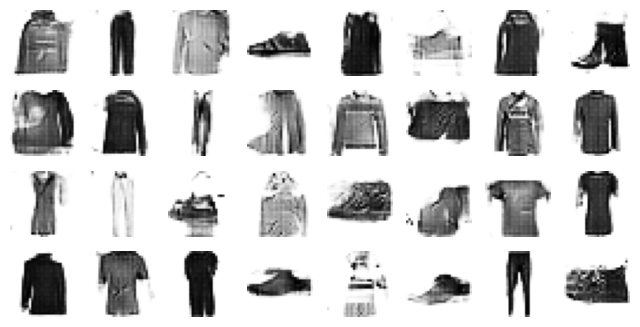

Epoch 36/50


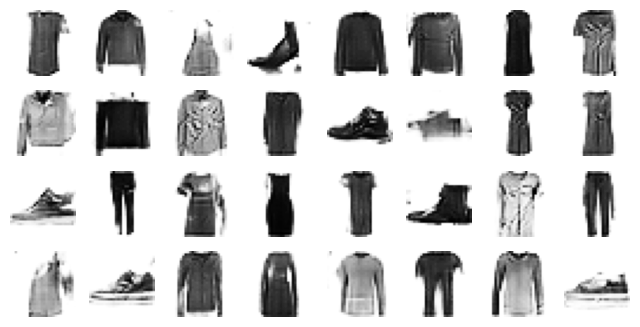

Epoch 37/50


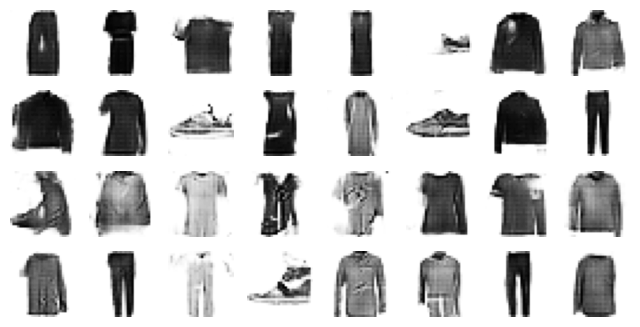

Epoch 38/50


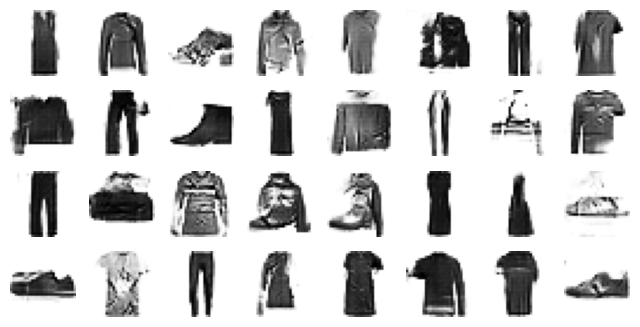

Epoch 39/50


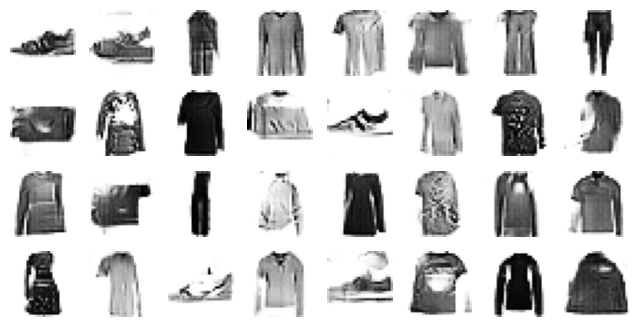

Epoch 40/50


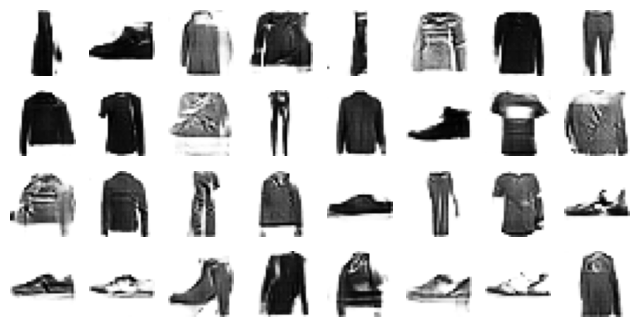

Epoch 41/50


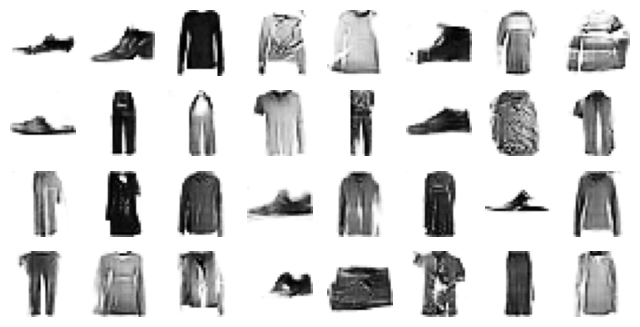

Epoch 42/50


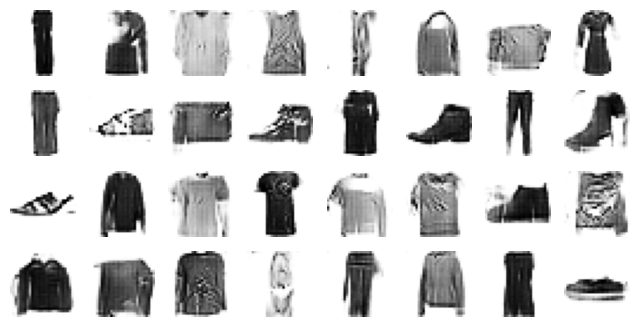

Epoch 43/50


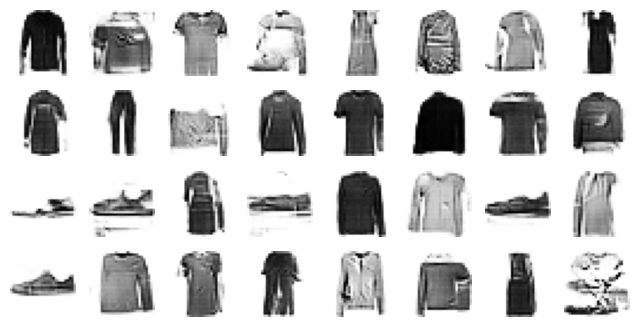

Epoch 44/50


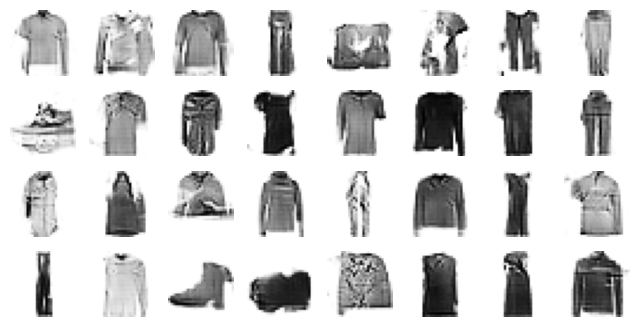

Epoch 45/50


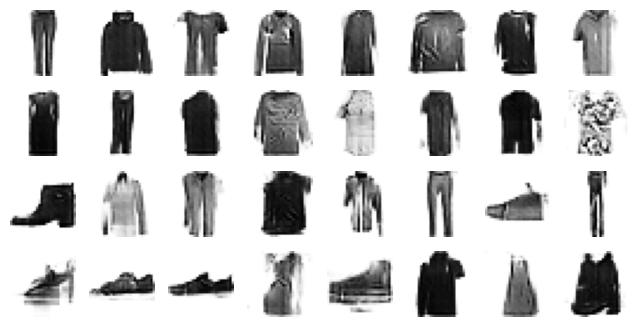

Epoch 46/50


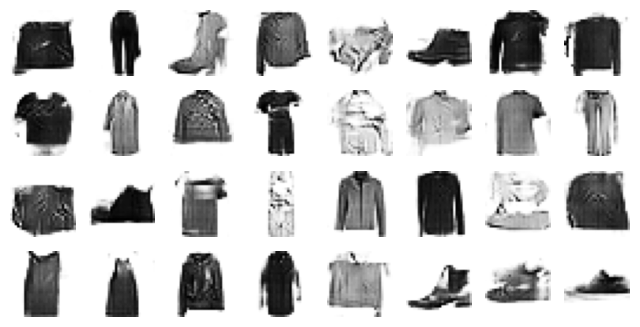

Epoch 47/50


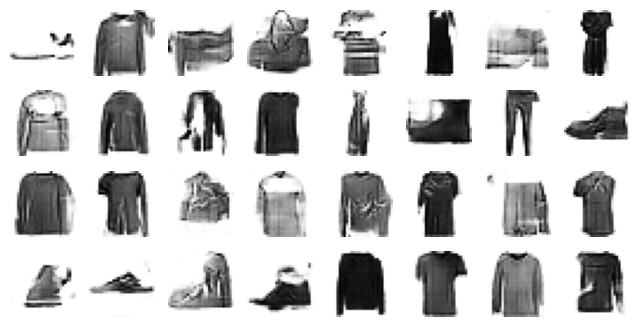

Epoch 48/50


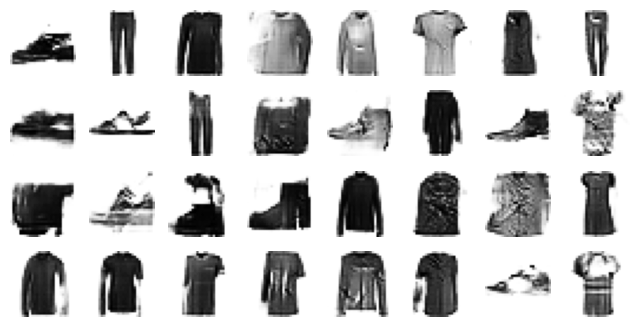

Epoch 49/50


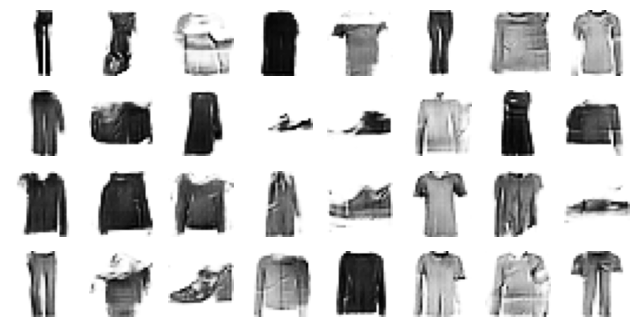

Epoch 50/50


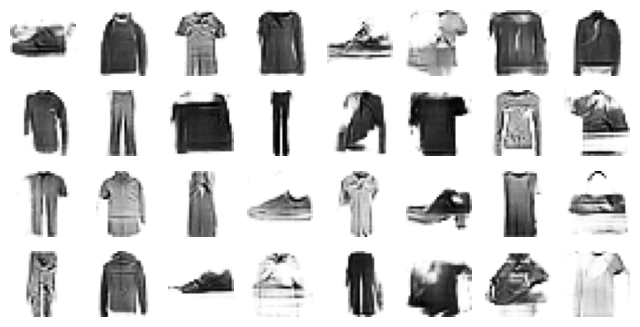

In [29]:
# extra code – generates the dataset and trains the GAN, just like earlier
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)
train_gan(gan, dataset, batch_size, codings_size, n_epochs=50)


### Diffusion Models

In [8]:
def variance_schedule(T, s=0.008, max_beta=0.999):
    t = np.arange(T+1)
    f = np.cos((t/T+s)/(1+s)*np.pi/2)**2
    alpha = np.clip(f[1:]/f[:-1], 1-max_beta, 1)
    alpha = np.append(1, alpha).astype(np.float32)
    beta = 1-alpha
    alpha_cumprod = np.cumprod(alpha)
    return alpha, alpha_cumprod, beta


np.random.seed(42)
T = 4000
alpha, alpha_cumprod, beta = variance_schedule(T)


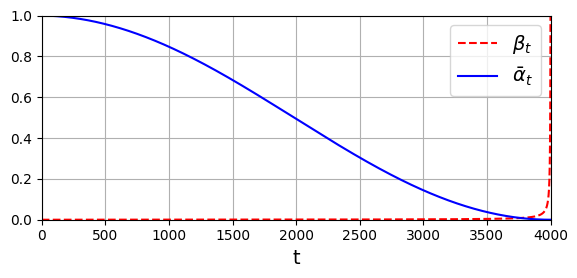

In [9]:
# extra code – this cell generates and saves Figure 17–21
plt.figure(figsize=(6, 3))
plt.plot(beta, "r--", label=r"$\beta_t$")
plt.plot(alpha_cumprod, "b", label=r"$\bar{\alpha}_t$")
plt.axis([0, T, 0, 1])
plt.grid(True)
plt.xlabel(r"t")
plt.legend()
save_fig("variance_schedule_plot")
plt.show()


In [14]:
def prepare_batch(X):
    X = tf.cast(X[..., tf.newaxis], tf.float32)*2-1
    X_shape = tf.shape(X)
    t = tf.random.uniform([X_shape[0]], minval=1, maxval=T+1, dtype=tf.int32)
    alpha_cm = tf.gather(alpha_cumprod, t)
    alpha_cm = tf.reshape(alpha_cm, [X_shape[0]]+[1]*(len(X_shape)-1))
    noise = tf.random.normal(X_shape)
    return {
        "X_noisy": alpha_cm**0.5*X+(1-alpha_cm)**0.5*noise,
        "time": t,
    }, noise


In [16]:
def prepare_dataset(X, batch_size=32, shuffle=False):
    ds = tf.data.Dataset.from_tensor_slices(X)
    if shuffle:
        ds = ds.shuffle(10_000)
    return ds.batch(batch_size).map(prepare_batch).prefetch(1)


tf.random.set_seed(43)
train_set = prepare_dataset(X_train, batch_size=32, shuffle=True)
valid_set = prepare_dataset(X_valid, batch_size=32)


I0000 00:00:1752475305.712551      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


In [21]:
# extra code – just a quick sanity check

def subtract_noise(X_noisy, time, noise):
    X_shape = tf.shape(X_noisy)
    alpha_cm = tf.gather(alpha_cumprod, time)
    alpha_cm = tf.reshape(alpha_cm, [X_shape[0]] + [1] * (len(X_shape) - 1))
    return (X_noisy - (1 - alpha_cm) ** 0.5 * noise) / alpha_cm ** 0.5


X_dict, Y_noise = list(train_set.take(1))[0]  # get the first batch
X_original = subtract_noise(X_dict["X_noisy"], X_dict["time"], Y_noise)

print("Original images")
# plot_multiple_images(X_original[:8].numpy())
plt.show()
print("Time steps:", X_dict["time"].numpy()[:8])
print("Noisy images")
# plot_multiple_images(X_dict["X_noisy"][:8].numpy())
plt.show()
print("Noise to predict")
# plot_multiple_images(Y_noise[:8].numpy())
plt.show()


Original images
Time steps: [3405  312 3441 1991 2443 1657 3308 1151]
Noisy images
Noise to predict


In [22]:
"""implement a custom time encoding layer"""

embed_size = 64


class TimeEncoding(tf.keras.layers.Layer):
    def __init__(self, T, embed_size, dtype=tf.float32, **kwargs):
        super().__init__(dtype=dtype, **kwargs)
        assert embed_size % 2 == 0, "embed_size must be even"

        p, i = np.meshgrid(np.arange(T+1), 2*np.arange(embed_size//2))

        t_emb = np.empty((T+1, embed_size))
        t_emb[:, ::2] = np.sin(p/10_000**(i/embed_size)).T
        t_emb[:, 1::2] = np.cos(p/10_000**(i/embed_size)).T
        self.time_encodings = tf.constant(t_emb.astype(self.dtype))

    def call(self, inputs):
        return tf.gather(self.time_encodings, inputs)


*create a model like UNet- like model*

*goes through `Conv2D` + `BatchNormalization` layer and skip connections*

*Gradually downsampling the image (using `MaxPooling` layer with `Strides=2)`*

*then growing it back again(using `Upsampling2D` layer)*


In [23]:
def build_diffusion_model():
    X_noisy = tf.keras.layers.Input(shape=[28, 28, 1], name="X_noisy")
    time_input = tf.keras.layers.Input(shape=[], dtype=tf.int32, name="time")
    time_enc = TimeEncoding(T, embed_size)(time_input)

    dim = 16
    Z = tf.keras.layers.ZeroPadding2D((3, 3))(X_noisy)
    Z = tf.keras.layers.Conv2D(dim, 3)(Z)
    Z = tf.keras.layers.BatchNormalization()(Z)
    Z = tf.keras.layers.Activation("relu")(Z)

    time = tf.keras.layers.Dense(dim)(time_enc)
    Z = time[:, tf.newaxis, tf.newaxis, :]+Z

    skip = Z

    cross_skips = []

    for dim in (32, 64, 128):
        Z = tf.keras.layers.Activation("relu")(Z)
        Z = tf.keras.layers.SeparableConv2D(dim, 3, padding="same")(Z)
        Z = tf.keras.layers.BatchNormalization()(Z)

        Z = tf.keras.layers.Activation("relu")(Z)
        Z = tf.keras.layers.SeparableConv2D(dim, 3, padding="same")(Z)
        Z = tf.keras.layers.BatchNormalization()(Z)

        cross_skips.append(Z)
        Z = tf.keras.layers.MaxPooling2D(3, strides=2, padding="same")(Z)
        skip_link = tf.keras.layers.Conv2D(dim, 1, strides=2,
                                           padding="same")(skip)

        Z = tf.keras.layers.add([Z, skip_link])

        time = tf.keras.layers.Dense(dim)(time_enc)
        Z = time[:, tf.newaxis, tf.newaxis, :]+Z
        skip = Z

    for dim in (64, 32, 16):
        Z = tf.keras.layers.Activation("relu")(Z)
        Z = tf.keras.layers.Conv2DTranspose(dim, 3, padding="same")(Z)
        Z = tf.keras.layers.BatchNormalization()(Z)

        Z = tf.keras.layers.Activation("relu")(Z)
        Z = tf.keras.layers.Conv2DTranspose(dim, 3, padding="same")(Z)
        Z = tf.keras.layers.BatchNormalization()(Z)

        Z = tf.keras.layers.UpSampling2D(2)(Z)

        skip_link = tf.keras.layers.UpSampling2D(2)(skip)

        skip_link = tf.keras.layers.Conv2D(dim, 1, padding="same")(skip_link)
        Z = tf.keras.layers.add([Z, skip_link])

        time = tf.keras.layers.Dense(dim)(time_enc)
        Z = time[:, tf.newaxis, tf.newaxis, :]+Z
        Z = tf.keras.layers.concatenate([Z, cross_skips.pop()], axis=-1)
        skip = Z

    outputs = tf.keras.layers.Conv2D(1, 3, padding="same")(Z)[:, 2:-2, 2:-2]
    return tf.keras.Model(inputs=[X_noisy, time_input], outputs=[outputs])


*let's train the model*

In [24]:
tf.random.set_seed(42)

model = build_diffusion_model()
model.compile(loss=tf.keras.losses.Huber(),
              optimizer=tf.keras.optimizers.Nadam())

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("my_diffusion_model",
                                                   save_best_only=True)

history = model.fit(train_set, validation_data=valid_set, epochs=100,
                    callbacks=[checkpoint_cb])


Epoch 1/100


E0000 00:00:1752477719.562470      36 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape ingradient_tape/huber_loss/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1752477720.766175     239 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1752477722.959219     239 service.cc:148] XLA service 0x7c04e4d54eb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1752477722.960007     239 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1752477723.190842     239 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1719/1719 [==============================] - 77s 29ms/step - loss: 0.1006 - val_loss: 0.0671
Epoch 2/100
1719/1719 [==============================] - 50s 29ms/step - loss: 0.0606 - val_loss: 0.0592
Epoch 3/100
1719/1719 [==============================] - 49s 29ms/step - loss: 0.0533 - val_loss: 0.0505
Epoch 4/100
1719/1719 [==============================] - 50s 29ms/step - loss: 0.0491 - val_loss: 0.0484
Epoch 5/100
1719/1719 [==============================] - 50s 29ms/step - loss: 0.0465 - val_loss: 0.0454
Epoch 6/100
1719/1719 [==============================] - 49s 29ms/step - loss: 0.0452 - val_loss: 0.0452
Epoch 7/100
1719/1719 [==============================] - 50s 29ms/step - loss: 0.0440 - val_loss: 0.0432
Epoch 8/100
1719/1719 [==============================] - 35s 20ms/step - loss: 0.0433 - val_loss: 0.0441
Epoch 9/100
1719/1719 [==============================] - 49s 28ms/step - loss: 0.0427 - val_loss: 0.0428
Epoch 10/100
1719/1719 [==============================] - 49s 28ms/

*model is trained and we now generate new images using gaussian noise*

In [25]:
def generate(model, batch_size=32):
    X = tf.random.normal([batch_size, 28, 28, 1])
    for t in range(T - 1, 0, -1):
        print(f"\rt = {t}", end=" ")  # extra code – show progress
        noise = (tf.random.normal if t > 1 else tf.zeros)(tf.shape(X))
        X_noise = model({"X_noisy": X, "time": tf.constant([t] * batch_size)})
        X = (
            1 / alpha[t] ** 0.5
            * (X - beta[t] / (1 - alpha_cumprod[t]) ** 0.5 * X_noise)
            + (1 - alpha[t]) ** 0.5 * noise
        )
    return X


tf.random.set_seed(42)  # extra code – ensures reproducibility on the CPU
X_gen = generate(model)  # generated images


t = 1    

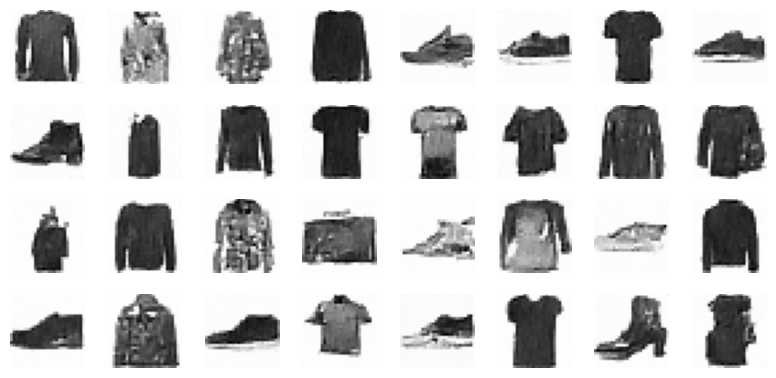

In [34]:
plot_multiple_images(X_gen.numpy(), 8)
save_fig("ddpm_generated_images_plot")
plt.show()
